# **Feature Engineering**

## Objectives

* Engineer features for Classification, Regression

## Inputs

* outputs/datasets/cleaned/TrainSetCleaned.csv
* outputs/datasets/cleaned/TestSetCleaned.csv

## Outputs

* Write here which files, code or artefacts you generate by the end of the notebook 

## Additional Comments

* In case you have any additional comments that don't fit in the previous bullets, please state them here. 


---

# Change working directory

* We are assuming you will store the notebooks in a subfolder, therefore when running the notebook in the editor, you will need to change the working directory

We need to change the working directory from its current folder to its parent folder
* We access the current directory with os.getcwd()

In [1]:
import os
current_dir = os.getcwd()
current_dir

'c:\\Users\\ajv10\\Documents\\vscode-projects\\PP5\\jupyter_notebooks'

We want to make the parent of the current directory the new current directory
* os.path.dirname() gets the parent directory
* os.chir() defines the new current directory

In [2]:
os.chdir(os.path.dirname(current_dir))
print("You set a new current directory")

You set a new current directory


Confirm the new current directory

In [3]:
current_dir = os.getcwd()
current_dir

'c:\\Users\\ajv10\\Documents\\vscode-projects\\PP5'

---

# Load Cleaned Data

## Train Set

In [4]:
import pandas as pd
train_set_path = "outputs/datasets/cleaned/TrainSetCleaned.csv"
TrainSet = pd.read_csv(train_set_path)
print(TrainSet.shape)
TrainSet.head(3)

(3028, 23)


,year,month,weekday,open,high,low,close,volume,pre_open,pre_open_2,...,pre_low_2,pre_close,pre_close_2,pre_vol,pre_vol_2,pre_average,pre_average_2,average,tomorrows_average,target
0,2010,January,Wednesday,497.990021,497.990021,497.990021,497.990021,10729.0,507.246289,477.996320,...,477.996320,497.990021,497.990021,10729.0,13401.0,502.618155,487.993170,497.990021,505.506095,1
1,2010,January,Thursday,507.468427,507.468427,503.543762,503.543762,6169.0,497.990021,507.246289,...,507.246289,497.990021,497.990021,10729.0,10729.0,497.990021,502.618155,505.506095,503.543762,0
2,2010,January,Friday,503.543762,503.543762,503.543762,503.543762,6169.0,507.468427,497.990021,...,497.990021,503.543762,497.990021,6169.0,10729.0,505.506095,497.990021,503.543762,503.543762,0


## Test Set

In [5]:
test_set_path = 'outputs/datasets/cleaned/TestSetCleaned.csv'
TestSet = pd.read_csv(test_set_path)
print(TestSet.shape)
TestSet.head(3)

(757, 23)


,year,month,weekday,open,high,low,close,volume,pre_open,pre_open_2,...,pre_low_2,pre_close,pre_close_2,pre_vol,pre_vol_2,pre_average,pre_average_2,average,tomorrows_average,target
0,2021,December,Wednesday,656.429828,658.823337,649.648129,651.842163,750597.0,653.238491,638.677844,...,638.278895,647.454102,648.451477,940492.0,842501.0,650.346296,643.564660,654.135996,650.745146,0
1,2021,December,Thursday,652.839474,653.836784,648.052395,648.650818,561304.0,656.429828,653.238491,...,647.454102,651.842163,647.454102,750597.0,940492.0,654.135996,650.346296,650.745146,648.950143,0
2,2021,December,Friday,646.456866,651.443420,646.456866,651.443420,296702.0,652.839474,656.429828,...,649.648129,648.650818,651.842163,561304.0,750597.0,650.745146,654.135996,648.950143,658.424557,1


---

# Data Exploration

In [7]:
from ydata_profiling import ProfileReport
pandas_report = ProfileReport(df=TrainSet, minimal=True)
pandas_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---

# Feature Engineering

In [8]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from feature_engine import transformation as vt
from feature_engine.outliers import Winsorizer
from feature_engine.encoding import OrdinalEncoder
sns.set(style="whitegrid")
warnings.filterwarnings('ignore')
%matplotlib inline


def FeatureEngineeringAnalysis(df, analysis_type=None):
    """
    - used for quick feature engineering on numerical and categorical variables
    to decide which transformation can better transform the distribution shape
    - Once transformed, use a reporting tool, like ydata-profiling, to evaluate distributions
    """
    check_missing_values(df)
    allowed_types = ['numerical', 'ordinal_encoder', 'outlier_winsorizer']
    check_user_entry_on_analysis_type(analysis_type, allowed_types)
    list_column_transformers = define_list_column_transformers(analysis_type)

    # Loop in each variable and engineer the data according to the analysis type
    df_feat_eng = pd.DataFrame([])
    for column in df.columns:
        # create additional columns (column_method) to apply the methods
        df_feat_eng = pd.concat([df_feat_eng, df[column]], axis=1)
        for method in list_column_transformers:
            df_feat_eng[f"{column}_{method}"] = df[column]

        # Apply transformers in respective column_transformers
        df_feat_eng, list_applied_transformers = apply_transformers(
            analysis_type, df_feat_eng, column)

        # For each variable, assess how the transformations perform
        transformer_evaluation(
            column, list_applied_transformers, analysis_type, df_feat_eng)

    return df_feat_eng


def check_user_entry_on_analysis_type(analysis_type, allowed_types):
    """ Check analysis type """
    if analysis_type is None:
        raise SystemExit(
            f"You should pass analysis_type parameter as one of the following options: {allowed_types}")
    if analysis_type not in allowed_types:
        raise SystemExit(
            f"analysis_type argument should be one of these options: {allowed_types}")


def check_missing_values(df):
    if df.isna().sum().sum() != 0:
        raise SystemExit(
            f"There is a missing value in your dataset. Please handle that before getting into feature engineering.")


def define_list_column_transformers(analysis_type):
    """ Set suffix columns according to analysis_type"""
    if analysis_type == 'numerical':
        list_column_transformers = [
            "log_e", "log_10", "reciprocal", "power", "box_cox", "yeo_johnson"]

    elif analysis_type == 'ordinal_encoder':
        list_column_transformers = ["ordinal_encoder"]

    elif analysis_type == 'outlier_winsorizer':
        list_column_transformers = ['iqr']

    return list_column_transformers


def apply_transformers(analysis_type, df_feat_eng, column):
    for col in df_feat_eng.select_dtypes(include='category').columns:
        df_feat_eng[col] = df_feat_eng[col].astype('object')

    if analysis_type == 'numerical':
        df_feat_eng, list_applied_transformers = FeatEngineering_Numerical(
            df_feat_eng, column)

    elif analysis_type == 'outlier_winsorizer':
        df_feat_eng, list_applied_transformers = FeatEngineering_OutlierWinsorizer(
            df_feat_eng, column)

    elif analysis_type == 'ordinal_encoder':
        df_feat_eng, list_applied_transformers = FeatEngineering_CategoricalEncoder(
            df_feat_eng, column)

    return df_feat_eng, list_applied_transformers


def transformer_evaluation(column, list_applied_transformers, analysis_type, df_feat_eng):
    # For each variable, assess how the transformations perform
    print(f"* Variable Analyzed: {column}")
    print(f"* Applied transformation: {list_applied_transformers} \n")
    for col in [column] + list_applied_transformers:

        if analysis_type != 'ordinal_encoder':
            DiagnosticPlots_Numerical(df_feat_eng, col)

        else:
            if col == column:
                DiagnosticPlots_Categories(df_feat_eng, col)
            else:
                DiagnosticPlots_Numerical(df_feat_eng, col)

        print("\n")


def DiagnosticPlots_Categories(df_feat_eng, col):
    plt.figure(figsize=(4, 3))
    sns.countplot(data=df_feat_eng, x=col, palette=[
                  '#432371'], order=df_feat_eng[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.suptitle(f"{col}", fontsize=30, y=1.05)
    plt.show()
    print("\n")


def DiagnosticPlots_Numerical(df, variable):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    sns.histplot(data=df, x=variable, kde=True, element="step", ax=axes[0])
    stats.probplot(df[variable], dist="norm", plot=axes[1])
    sns.boxplot(x=df[variable], ax=axes[2])

    axes[0].set_title('Histogram')
    axes[1].set_title('QQ Plot')
    axes[2].set_title('Boxplot')
    fig.suptitle(f"{variable}", fontsize=30, y=1.05)
    plt.tight_layout()
    plt.show()


def FeatEngineering_CategoricalEncoder(df_feat_eng, column):
    list_methods_worked = []
    try:
        encoder = OrdinalEncoder(encoding_method='arbitrary', variables=[
                                 f"{column}_ordinal_encoder"])
        df_feat_eng = encoder.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_ordinal_encoder")

    except Exception:
        df_feat_eng.drop([f"{column}_ordinal_encoder"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_OutlierWinsorizer(df_feat_eng, column):
    list_methods_worked = []

    # Winsorizer iqr
    try:
        disc = Winsorizer(
            capping_method='iqr', tail='both', fold=1.5, variables=[f"{column}_iqr"])
        df_feat_eng = disc.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_iqr")
    except Exception:
        df_feat_eng.drop([f"{column}_iqr"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked


def FeatEngineering_Numerical(df_feat_eng, column):
    list_methods_worked = []

    # LogTransformer base e
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_e"])
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_e")
    except Exception:
        df_feat_eng.drop([f"{column}_log_e"], axis=1, inplace=True)

    # LogTransformer base 10
    try:
        lt = vt.LogTransformer(variables=[f"{column}_log_10"], base='10')
        df_feat_eng = lt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_log_10")
    except Exception:
        df_feat_eng.drop([f"{column}_log_10"], axis=1, inplace=True)

    # ReciprocalTransformer
    try:
        rt = vt.ReciprocalTransformer(variables=[f"{column}_reciprocal"])
        df_feat_eng = rt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_reciprocal")
    except Exception:
        df_feat_eng.drop([f"{column}_reciprocal"], axis=1, inplace=True)

    # PowerTransformer
    try:
        pt = vt.PowerTransformer(variables=[f"{column}_power"])
        df_feat_eng = pt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_power")
    except Exception:
        df_feat_eng.drop([f"{column}_power"], axis=1, inplace=True)

    # BoxCoxTransformer
    try:
        bct = vt.BoxCoxTransformer(variables=[f"{column}_box_cox"])
        df_feat_eng = bct.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_box_cox")
    except Exception:
        df_feat_eng.drop([f"{column}_box_cox"], axis=1, inplace=True)

    # YeoJohnsonTransformer
    try:
        yjt = vt.YeoJohnsonTransformer(variables=[f"{column}_yeo_johnson"])
        df_feat_eng = yjt.fit_transform(df_feat_eng)
        list_methods_worked.append(f"{column}_yeo_johnson")
    except Exception:
        df_feat_eng.drop([f"{column}_yeo_johnson"], axis=1, inplace=True)

    return df_feat_eng, list_methods_worked

## Numerical Analysis

Add numerical features to list

In [9]:
feature_names_num = TrainSet.columns.tolist()[:21]
feature_names_num.pop(2)
feature_names_num.pop(1)
feature_names_num

['year',
 'open',
 'high',
 'low',
 'close',
 'volume',
 'pre_open',
 'pre_open_2',
 'pre_high',
 'pre_high_2',
 'pre_low',
 'pre_low_2',
 'pre_close',
 'pre_close_2',
 'pre_vol',
 'pre_vol_2',
 'pre_average',
 'pre_average_2',
 'average']

In [10]:
df_engineering_num = TrainSet[feature_names_num].copy()
print(df_engineering_num.shape)
df_engineering_num.head(3)

(3028, 19)


,year,open,high,low,close,volume,pre_open,pre_open_2,pre_high,pre_high_2,pre_low,pre_low_2,pre_close,pre_close_2,pre_vol,pre_vol_2,pre_average,pre_average_2,average
0,2010,497.990021,497.990021,497.990021,497.990021,10729.0,507.246289,477.996320,510.282389,504.136205,507.246289,477.996320,497.990021,497.990021,10729.0,13401.0,502.618155,487.993170,497.990021
1,2010,507.468427,507.468427,503.543762,503.543762,6169.0,497.990021,507.246289,497.990021,510.282389,497.990021,507.246289,497.990021,497.990021,10729.0,10729.0,497.990021,502.618155,505.506095
2,2010,503.543762,503.543762,503.543762,503.543762,6169.0,507.468427,497.990021,507.468427,497.990021,503.543762,497.990021,503.543762,497.990021,6169.0,10729.0,505.506095,497.990021,503.543762


Run numerical analysis

* Variable Analyzed: year
* Applied transformation: ['year_log_e', 'year_log_10', 'year_reciprocal', 'year_power', 'year_box_cox', 'year_yeo_johnson'] 



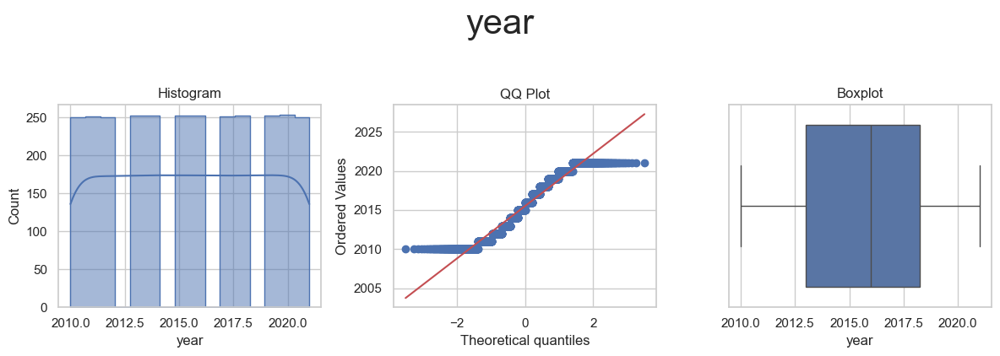

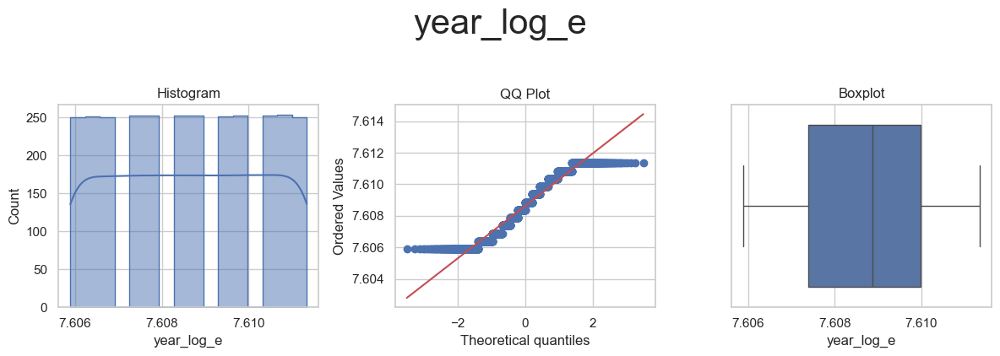

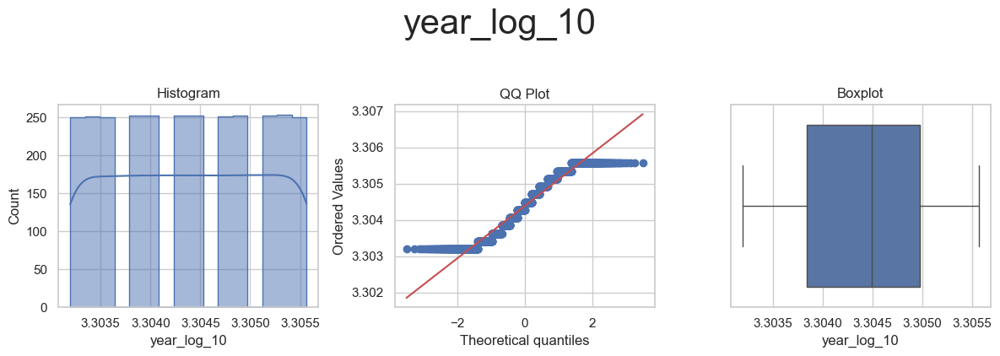

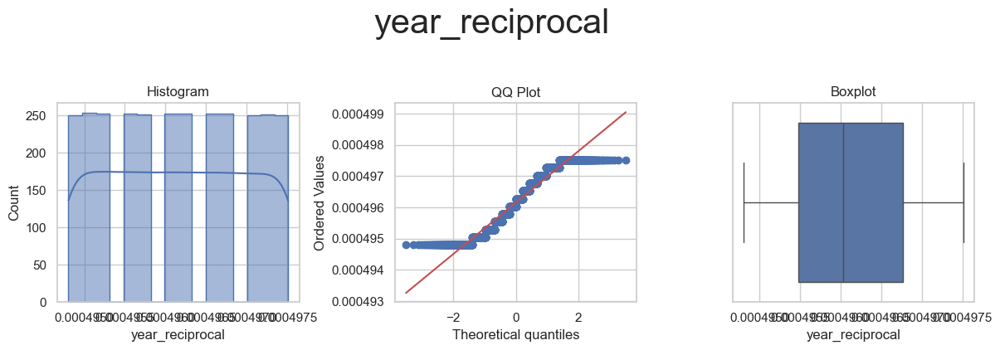

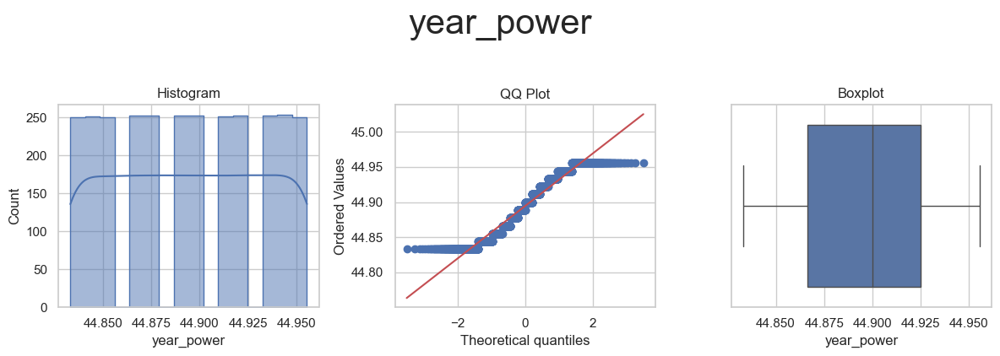

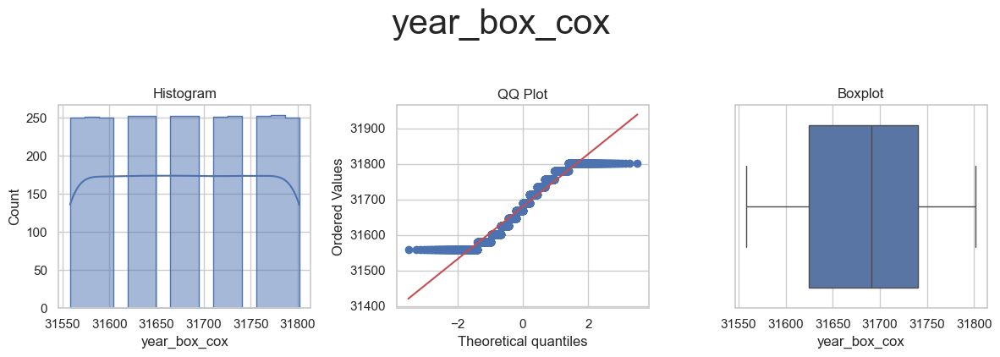

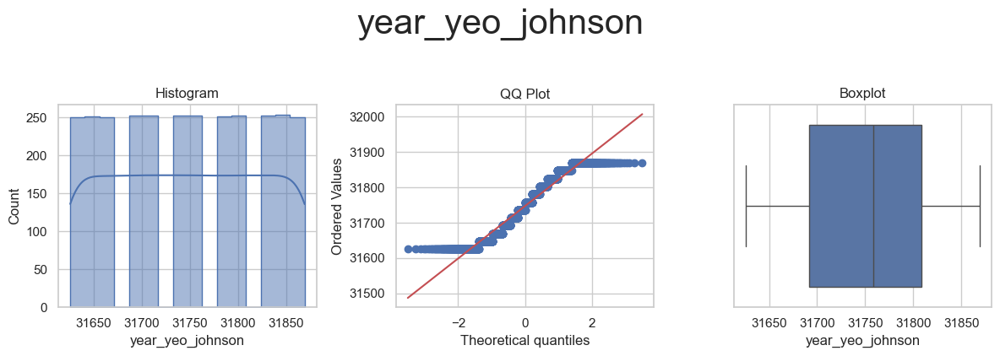



* Variable Analyzed: open
* Applied transformation: ['open_log_e', 'open_log_10', 'open_reciprocal', 'open_power', 'open_box_cox', 'open_yeo_johnson'] 



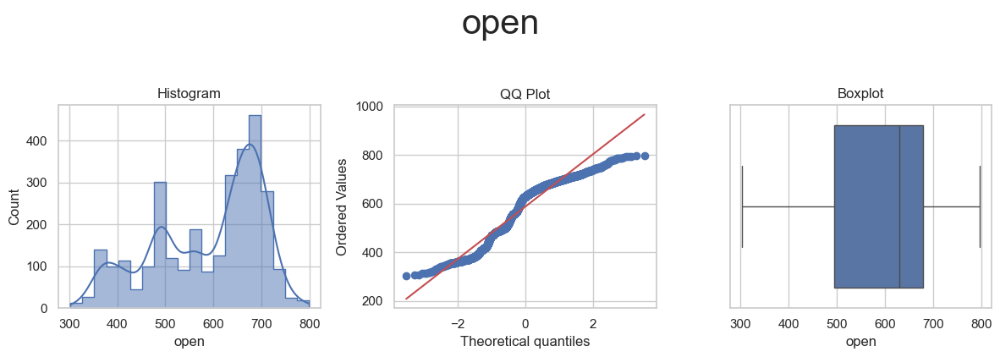

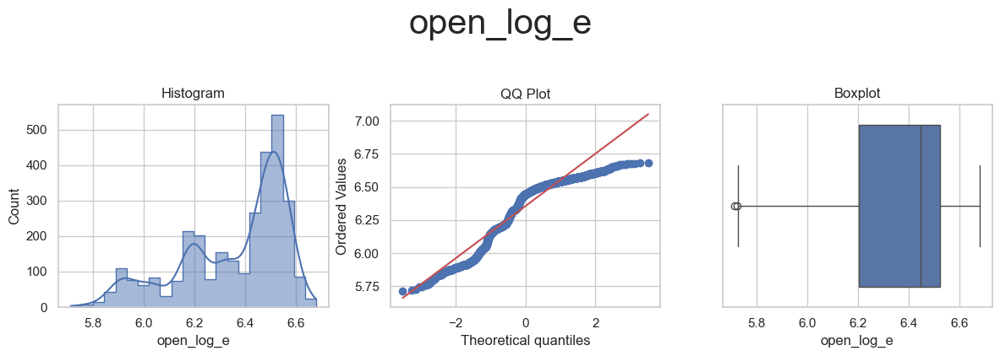

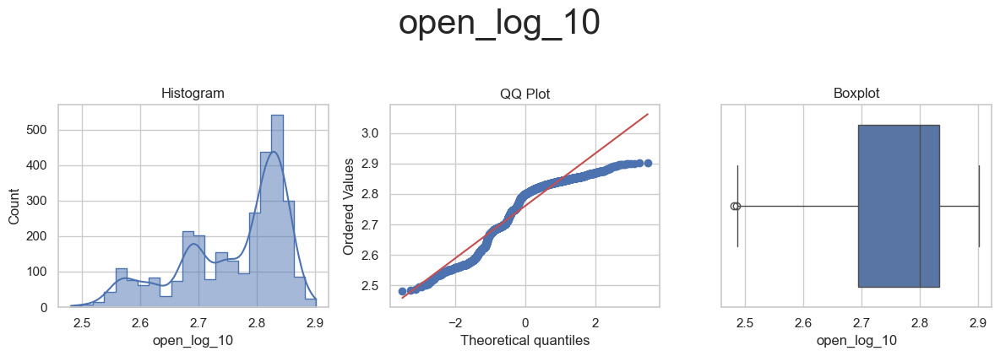

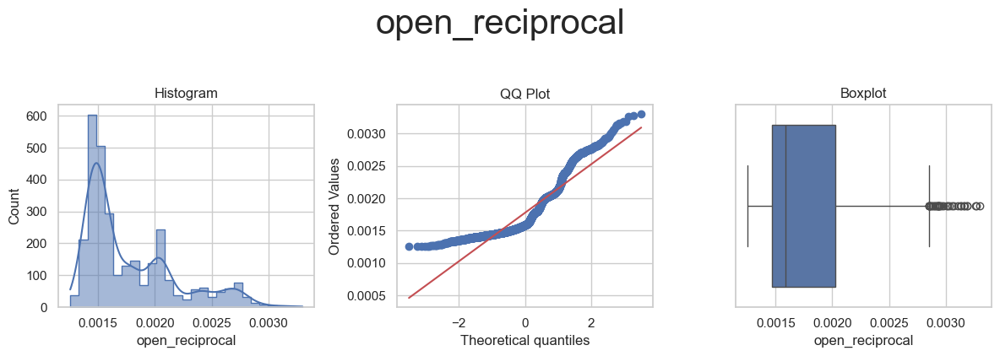

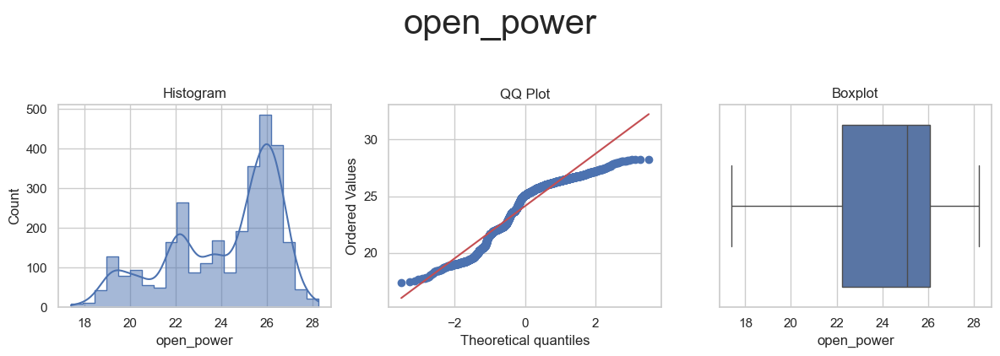

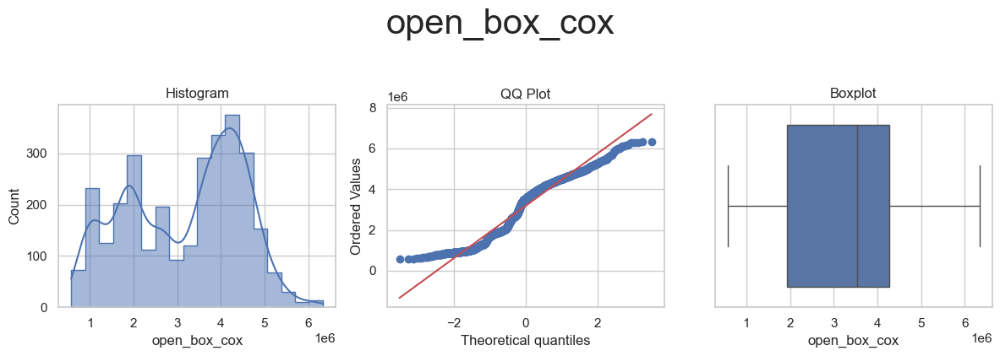

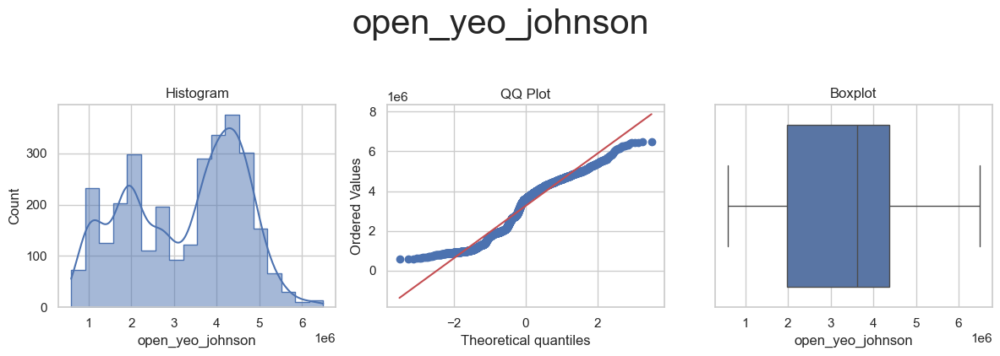



* Variable Analyzed: high
* Applied transformation: ['high_log_e', 'high_log_10', 'high_reciprocal', 'high_power', 'high_box_cox', 'high_yeo_johnson'] 



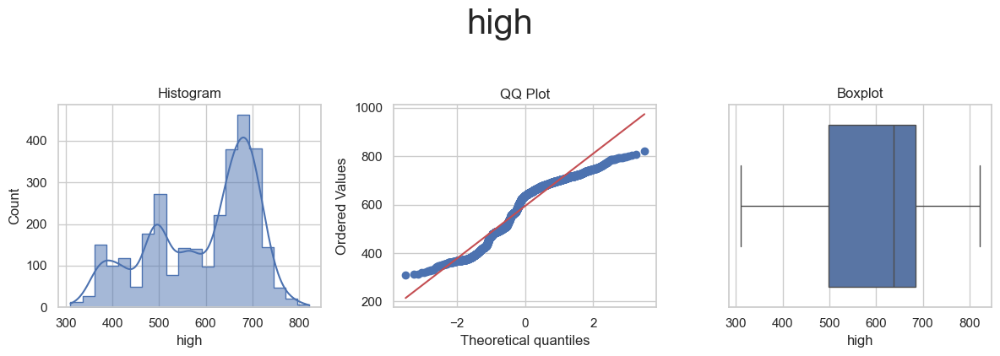

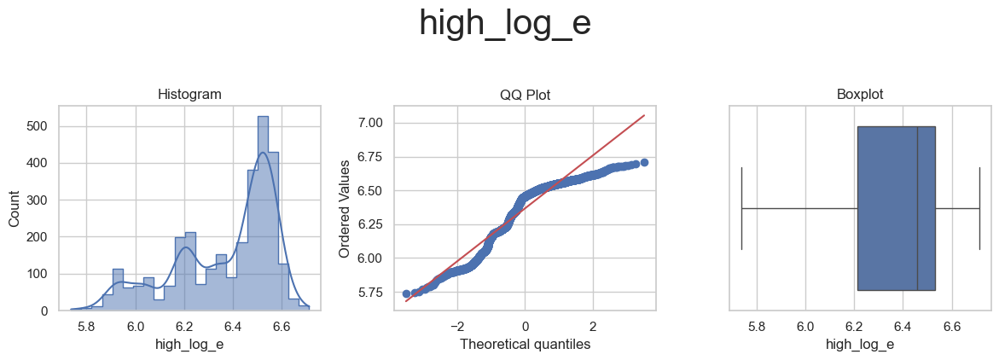

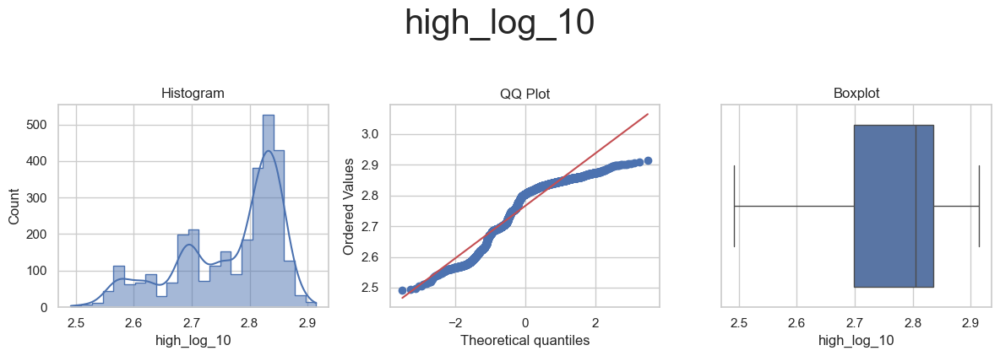

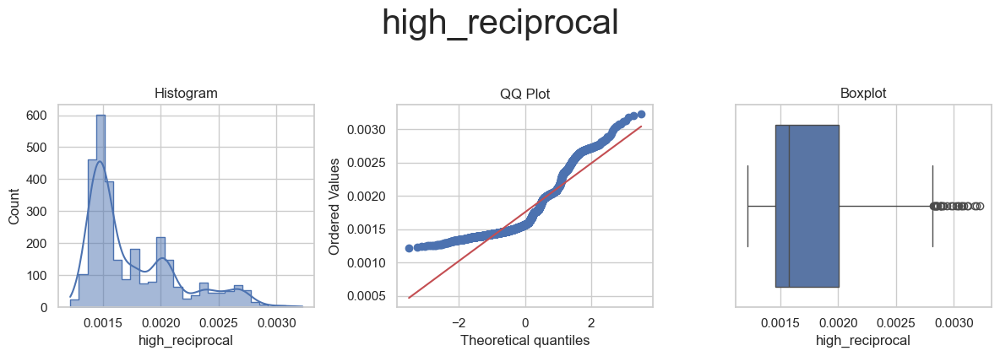

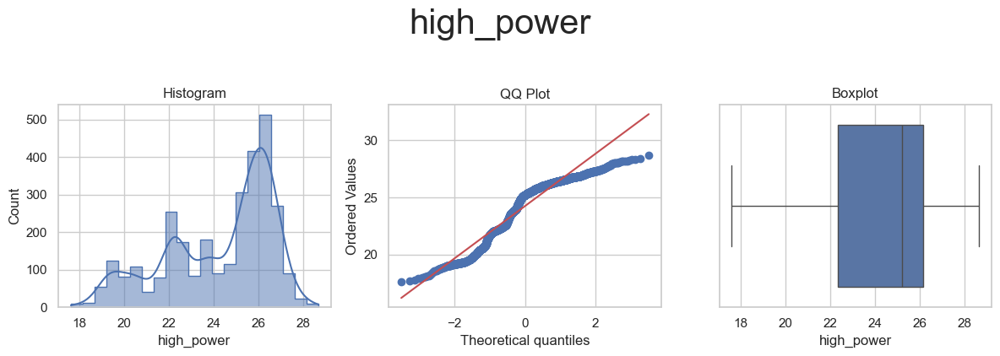

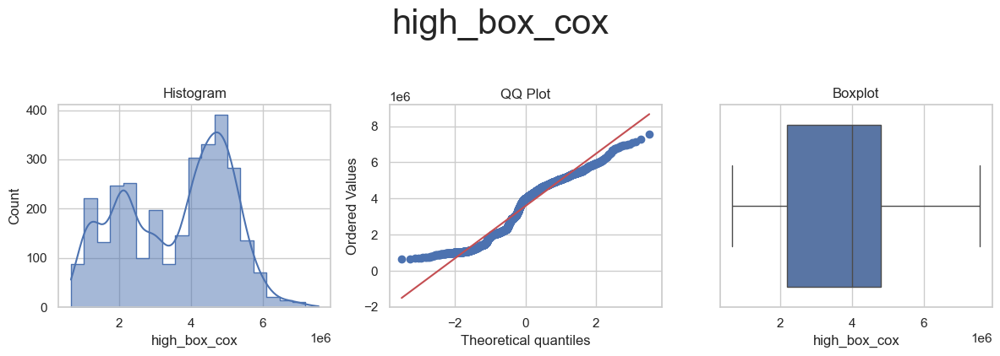

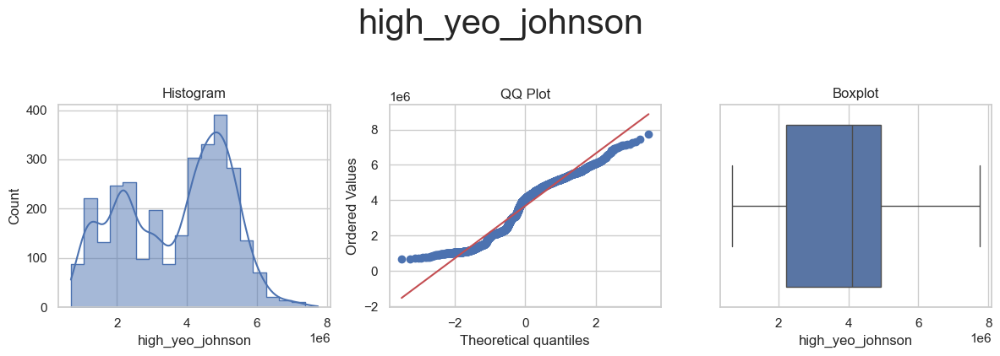



* Variable Analyzed: low
* Applied transformation: ['low_log_e', 'low_log_10', 'low_reciprocal', 'low_power', 'low_box_cox', 'low_yeo_johnson'] 



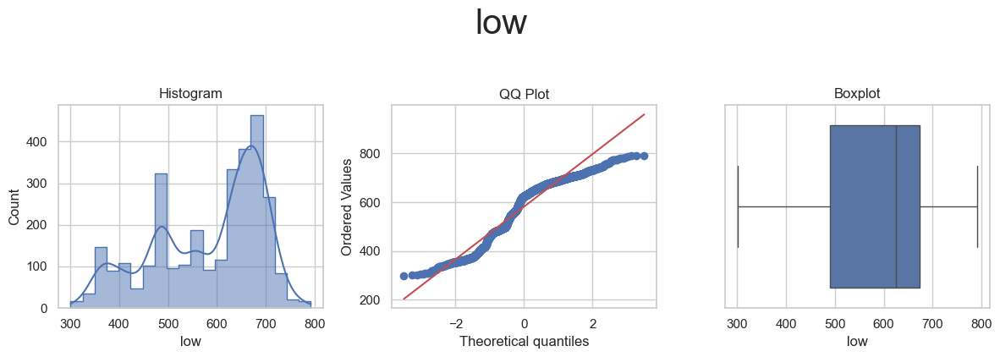

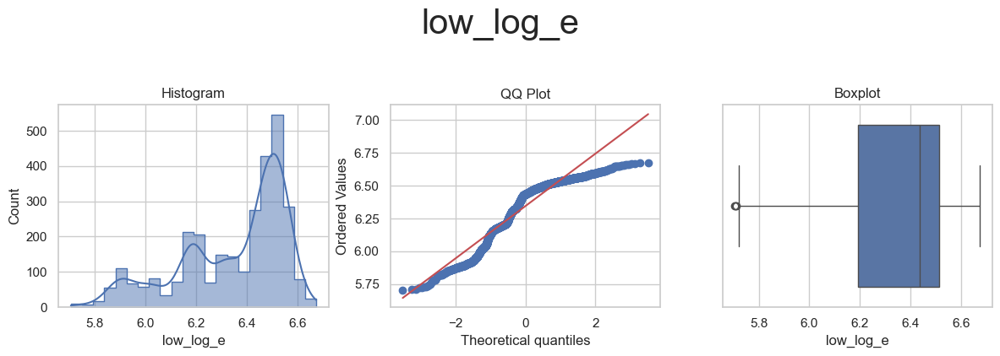

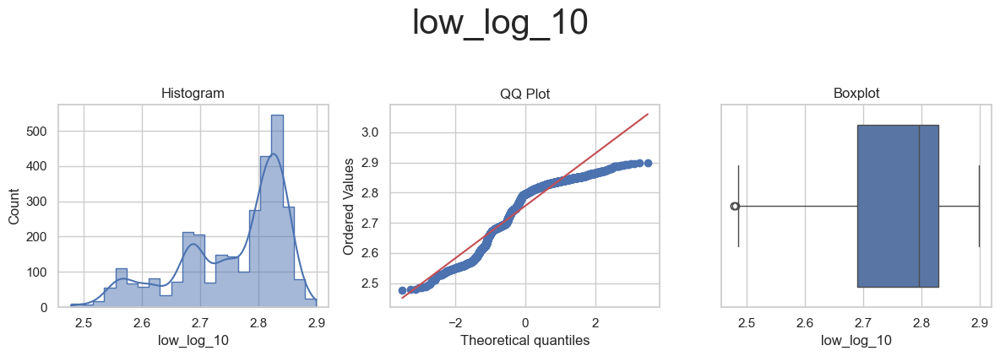

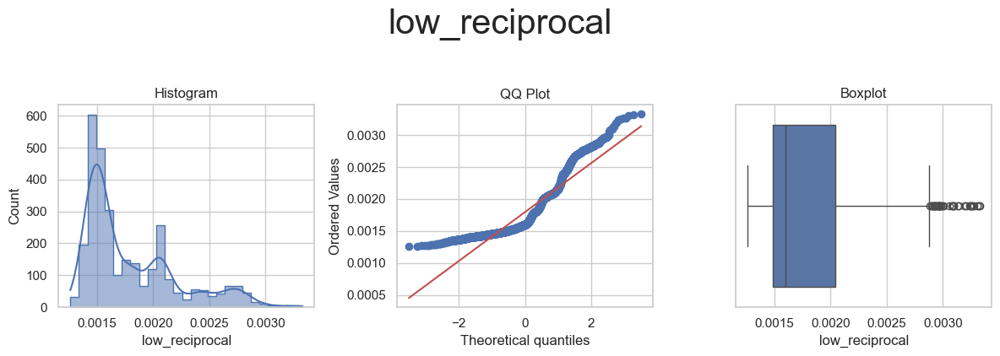

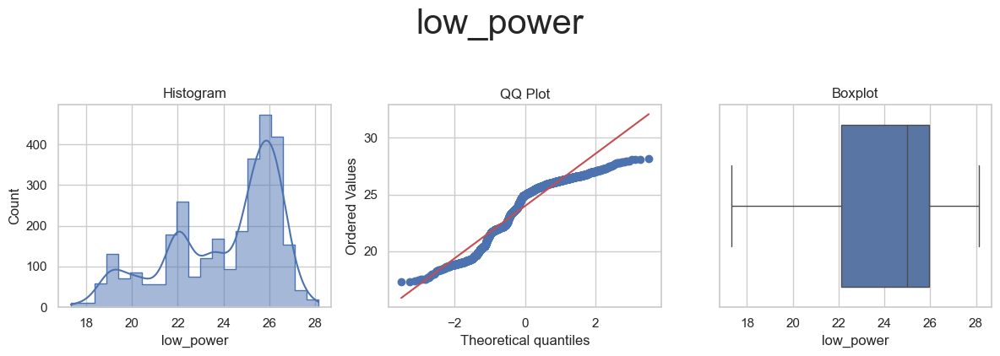

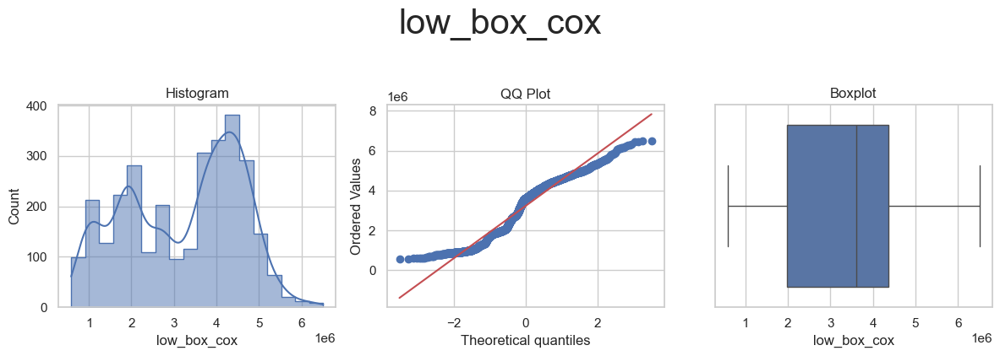

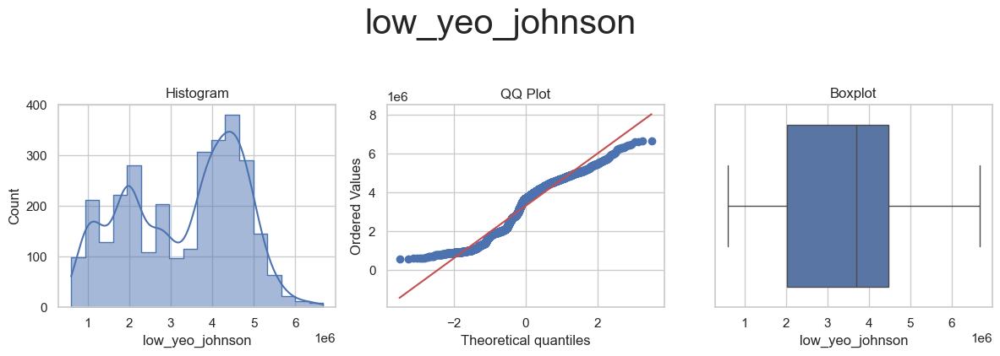



* Variable Analyzed: close
* Applied transformation: ['close_log_e', 'close_log_10', 'close_reciprocal', 'close_power', 'close_box_cox', 'close_yeo_johnson'] 



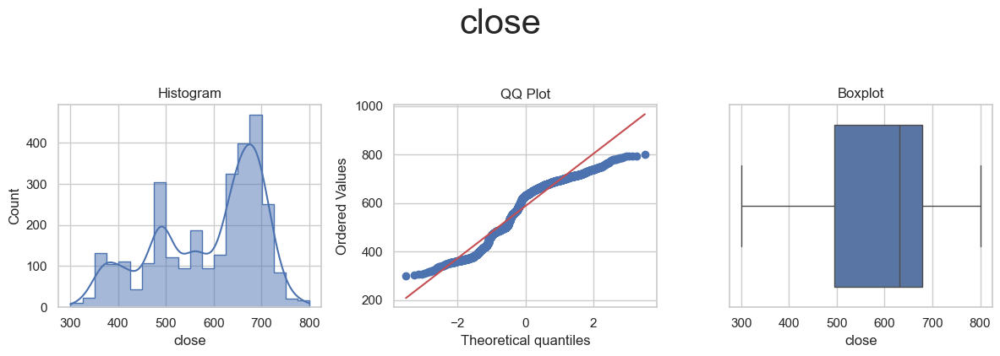

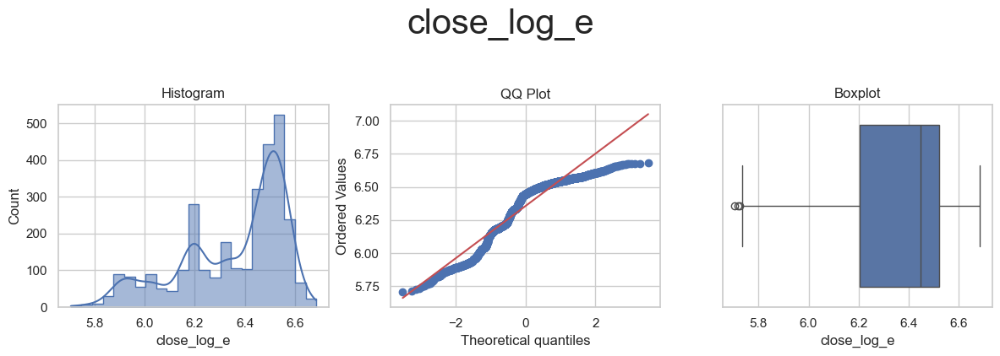

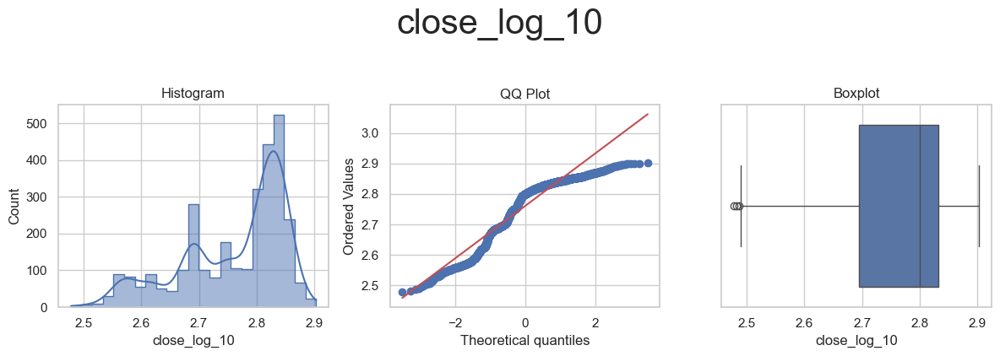

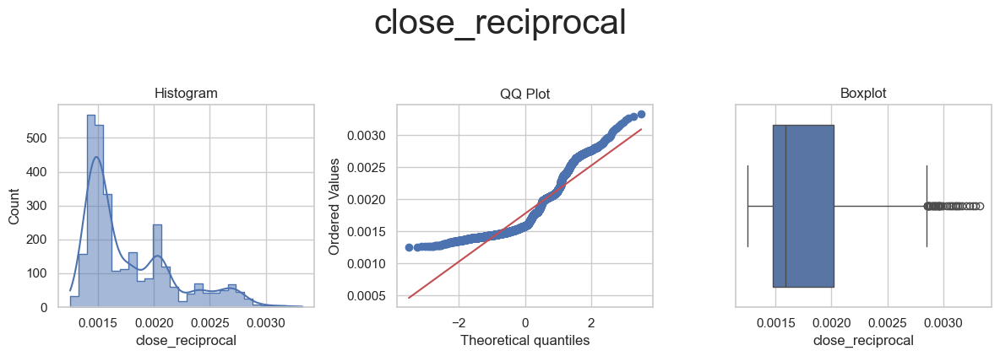

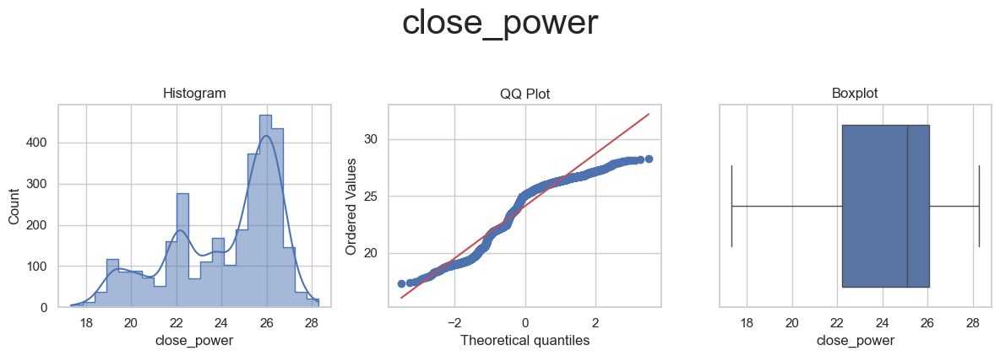

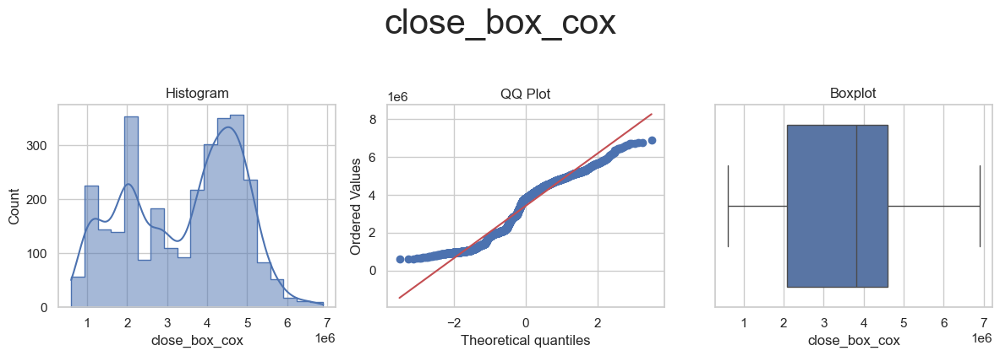

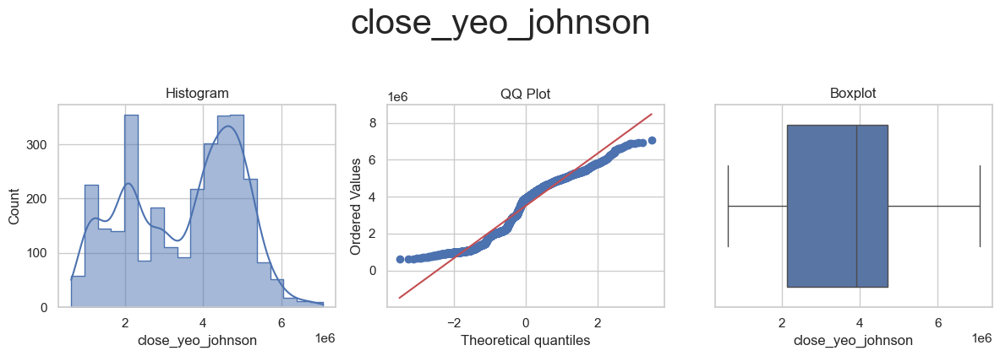



* Variable Analyzed: volume
* Applied transformation: ['volume_log_e', 'volume_log_10', 'volume_reciprocal', 'volume_power', 'volume_box_cox', 'volume_yeo_johnson'] 



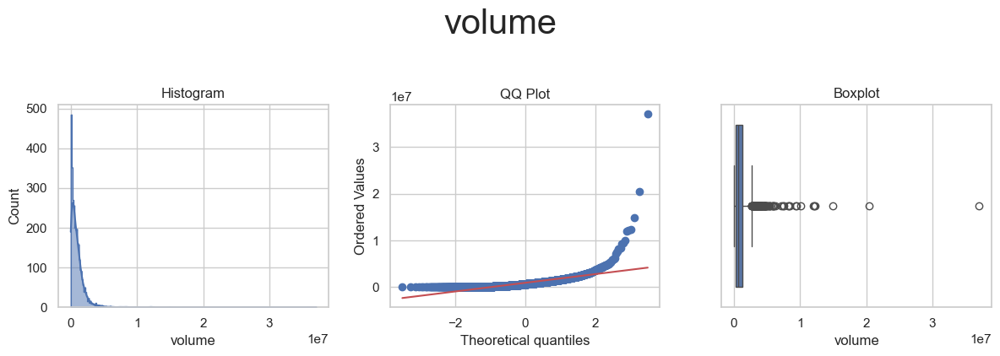

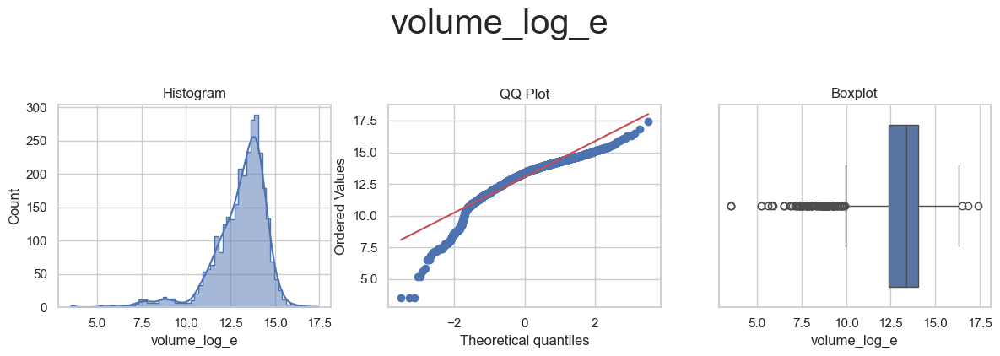

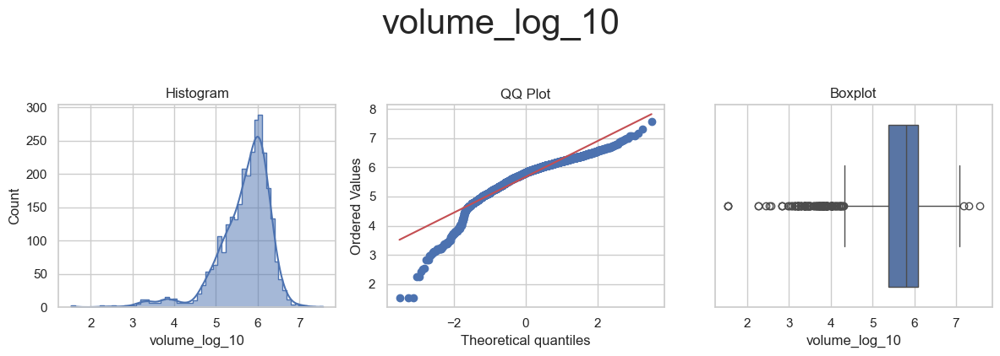

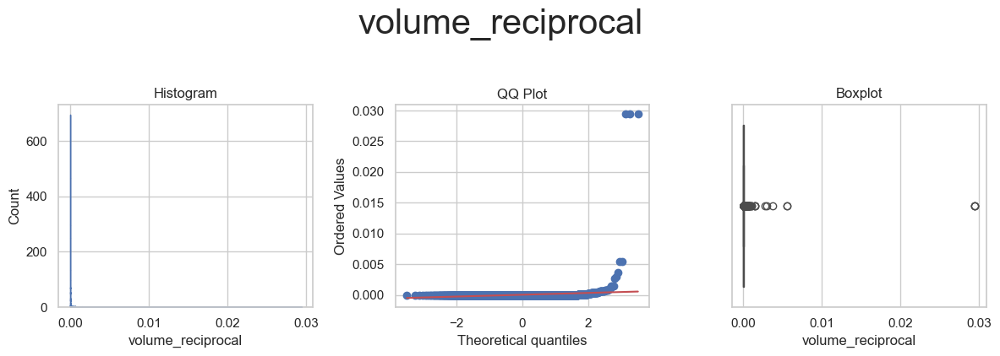

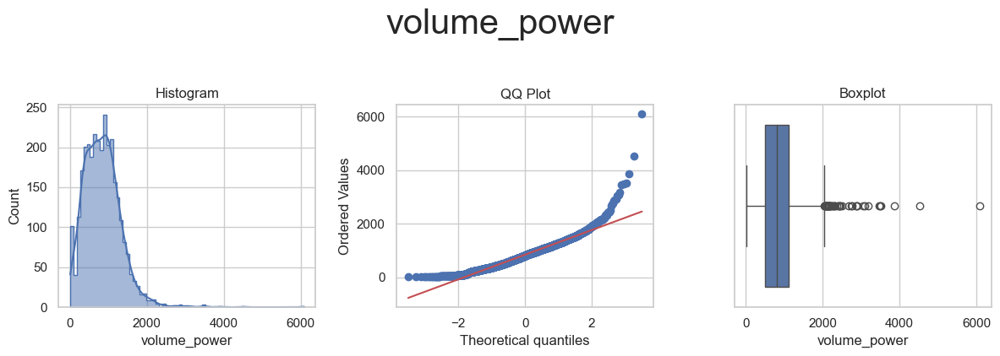

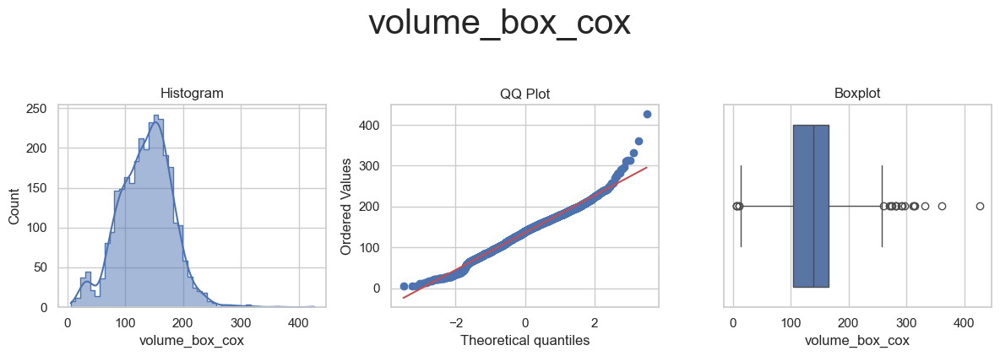

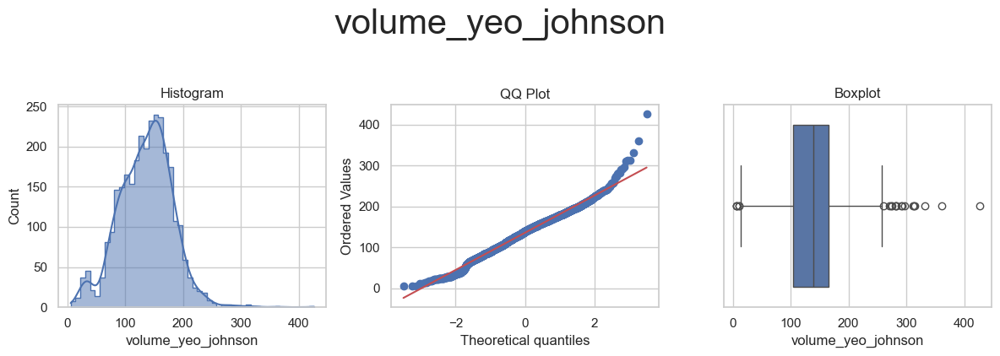



* Variable Analyzed: pre_open
* Applied transformation: ['pre_open_log_e', 'pre_open_log_10', 'pre_open_reciprocal', 'pre_open_power', 'pre_open_box_cox', 'pre_open_yeo_johnson'] 



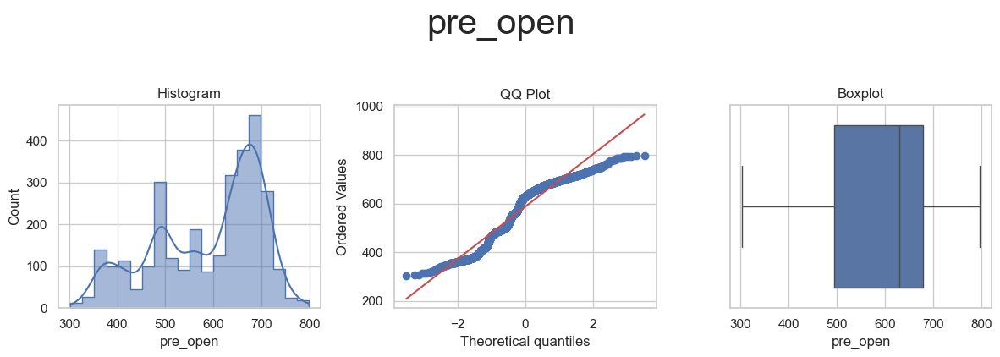

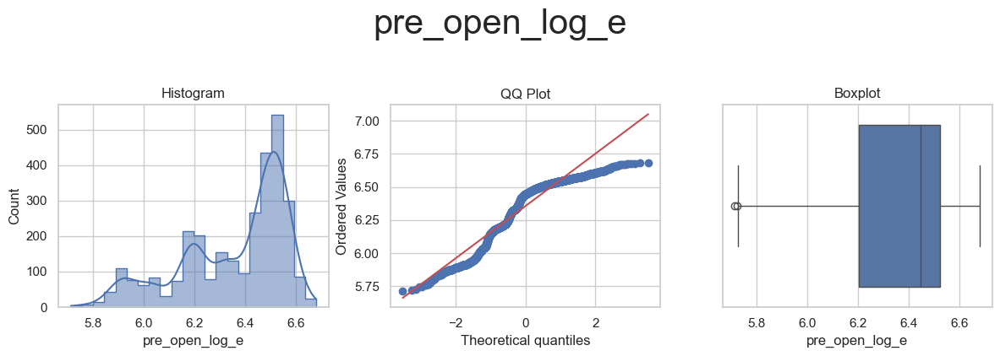

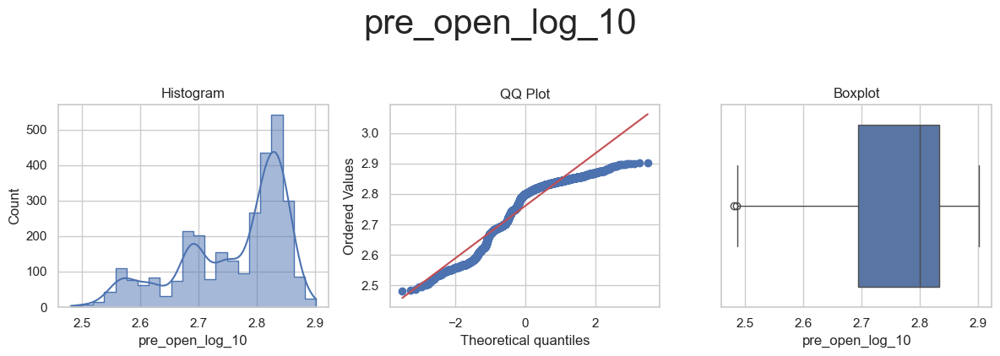

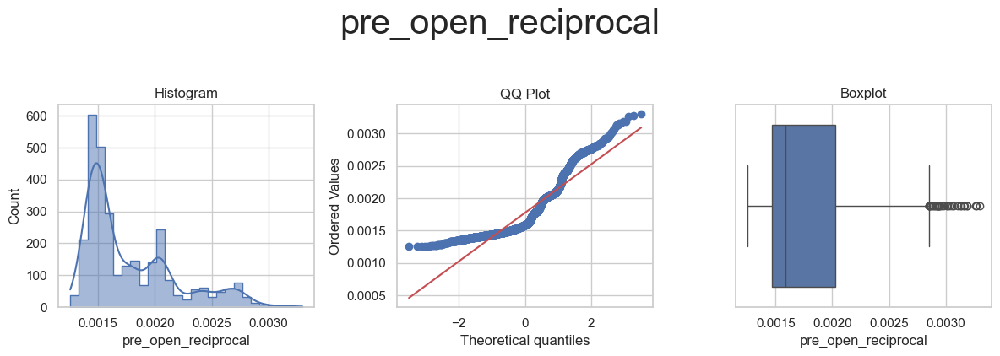

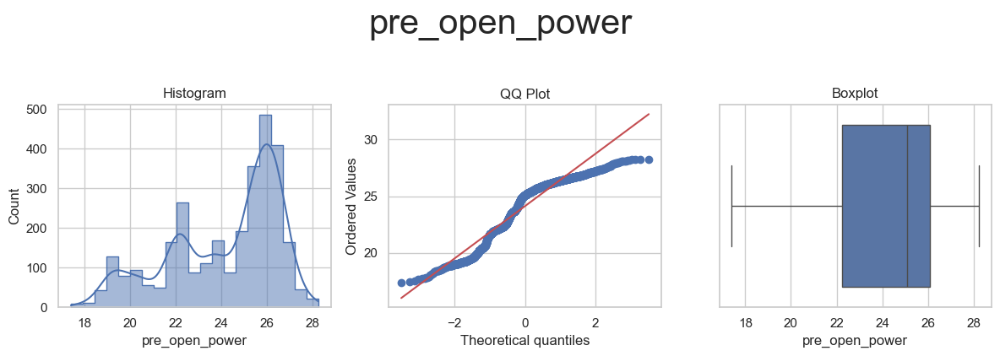

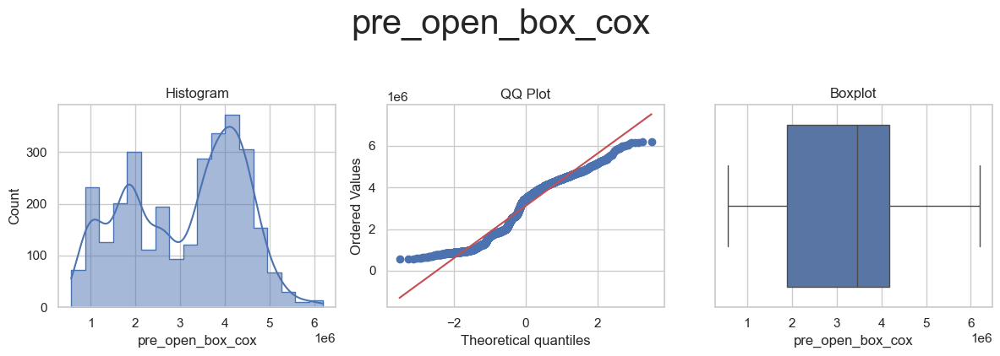

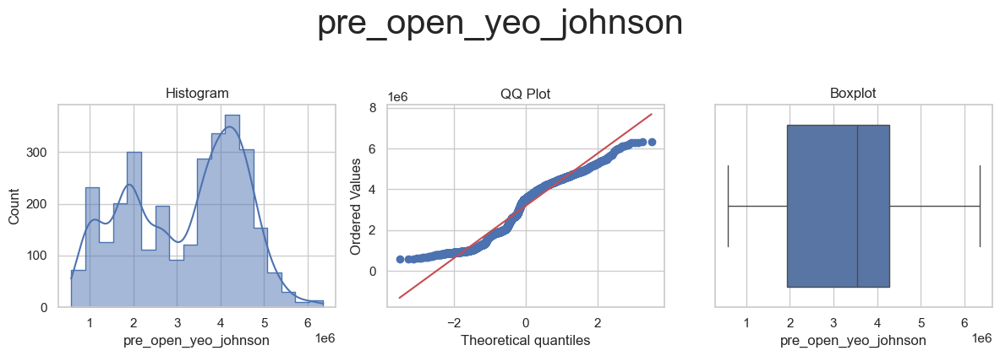



* Variable Analyzed: pre_open_2
* Applied transformation: ['pre_open_2_log_e', 'pre_open_2_log_10', 'pre_open_2_reciprocal', 'pre_open_2_power', 'pre_open_2_box_cox', 'pre_open_2_yeo_johnson'] 



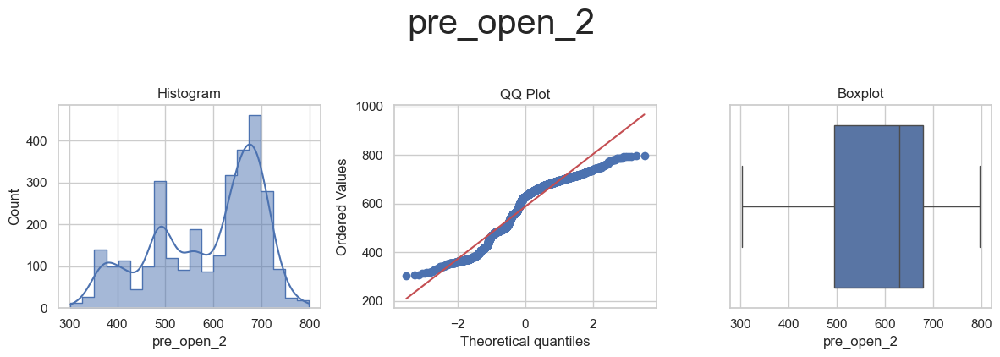

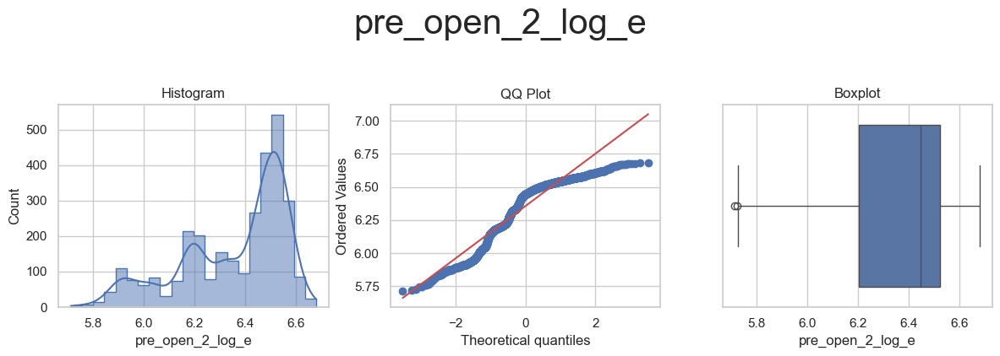

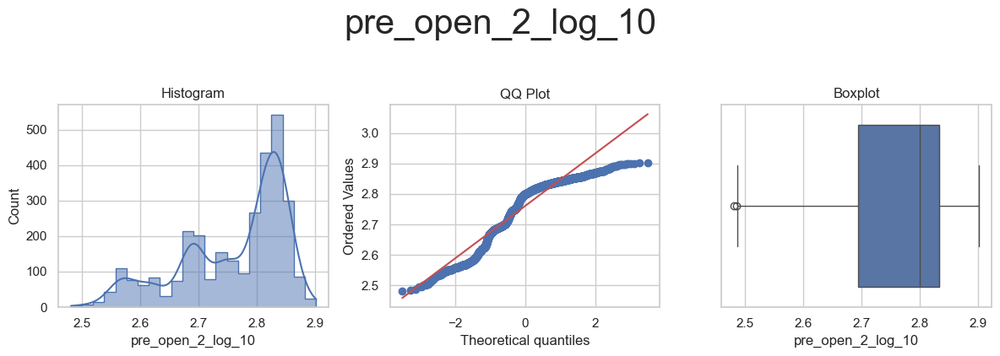

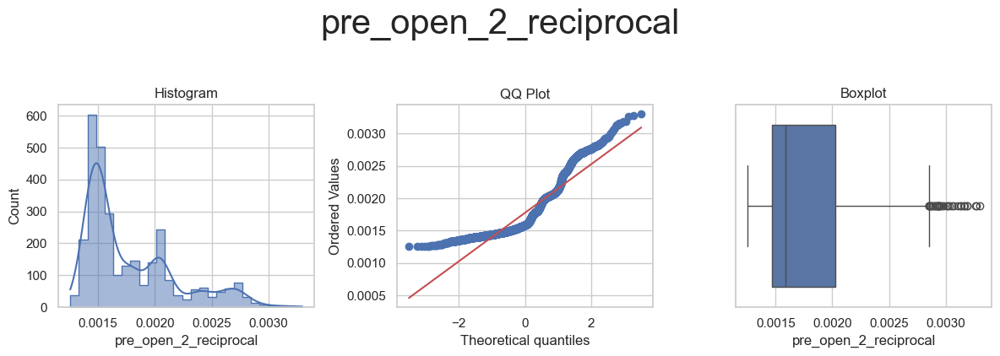

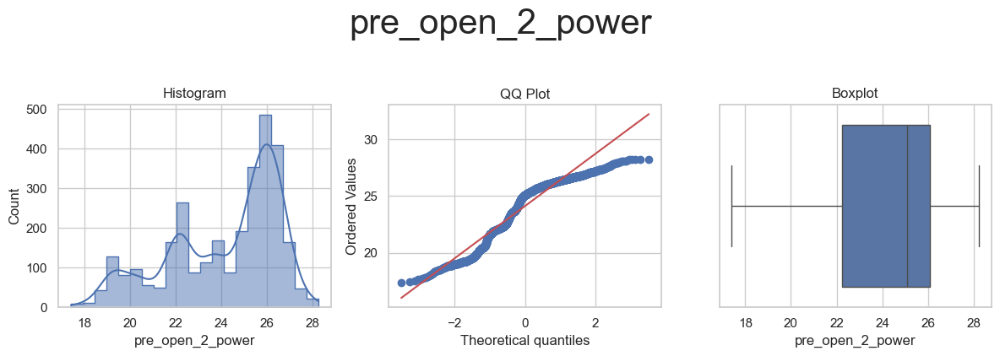

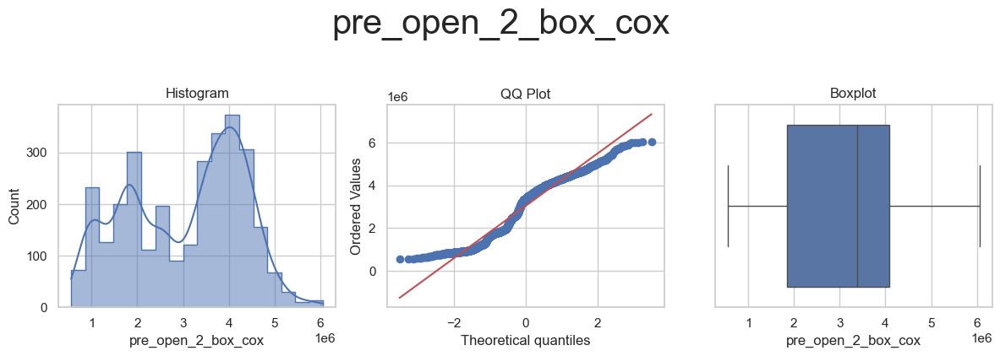

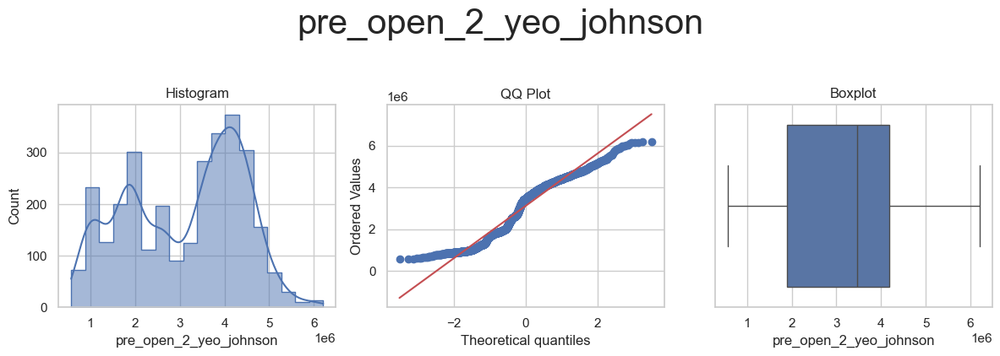



* Variable Analyzed: pre_high
* Applied transformation: ['pre_high_log_e', 'pre_high_log_10', 'pre_high_reciprocal', 'pre_high_power', 'pre_high_box_cox', 'pre_high_yeo_johnson'] 



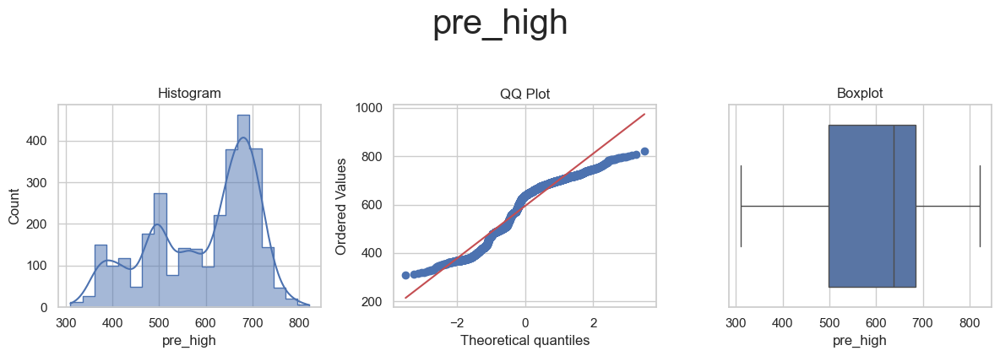

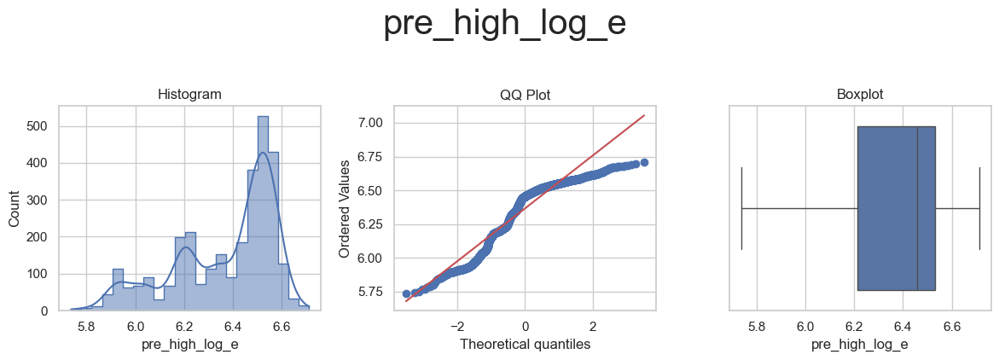

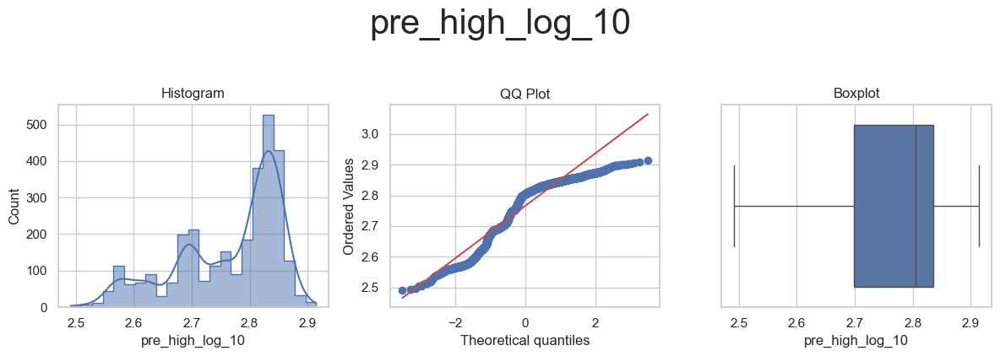

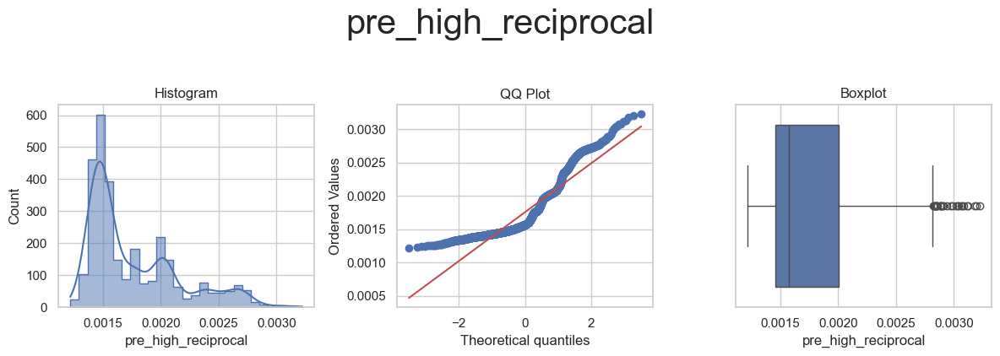

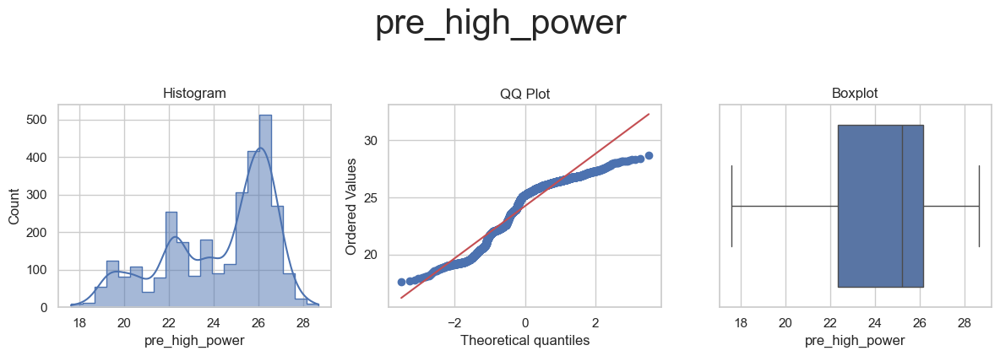

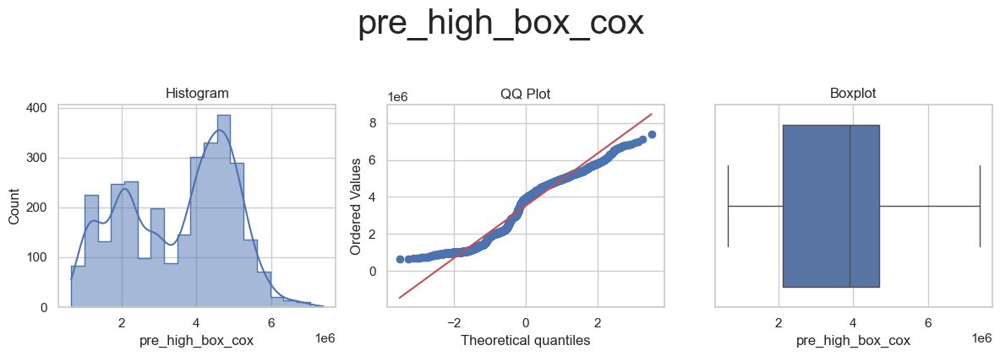

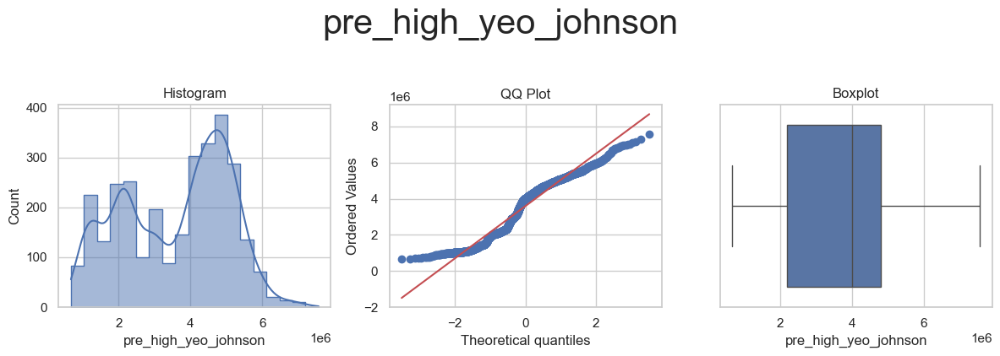



* Variable Analyzed: pre_high_2
* Applied transformation: ['pre_high_2_log_e', 'pre_high_2_log_10', 'pre_high_2_reciprocal', 'pre_high_2_power', 'pre_high_2_box_cox', 'pre_high_2_yeo_johnson'] 



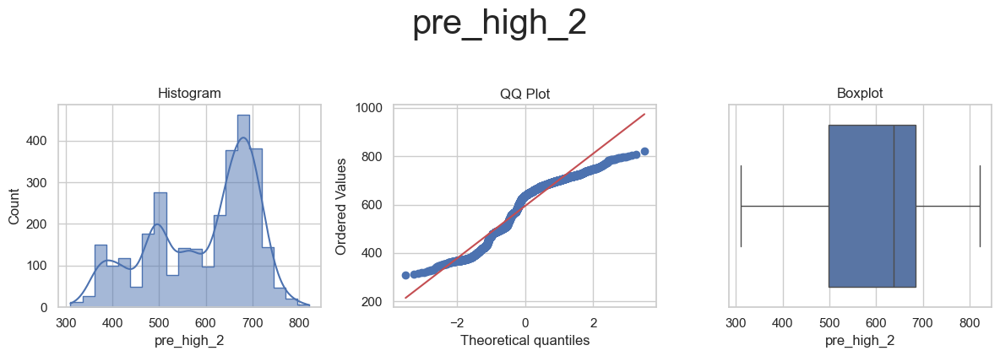

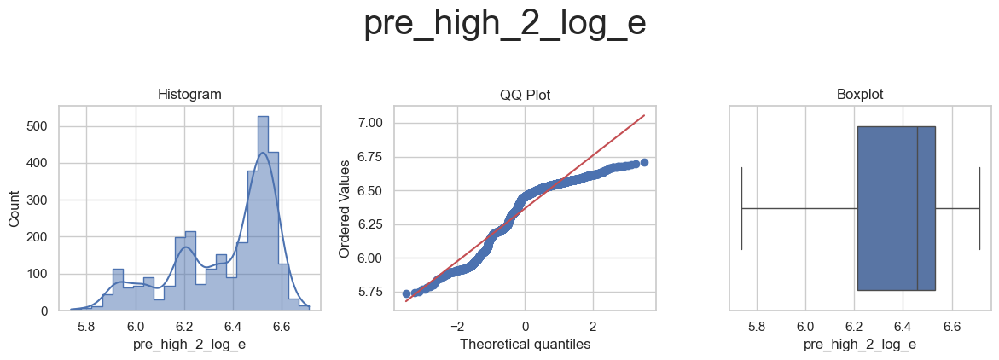

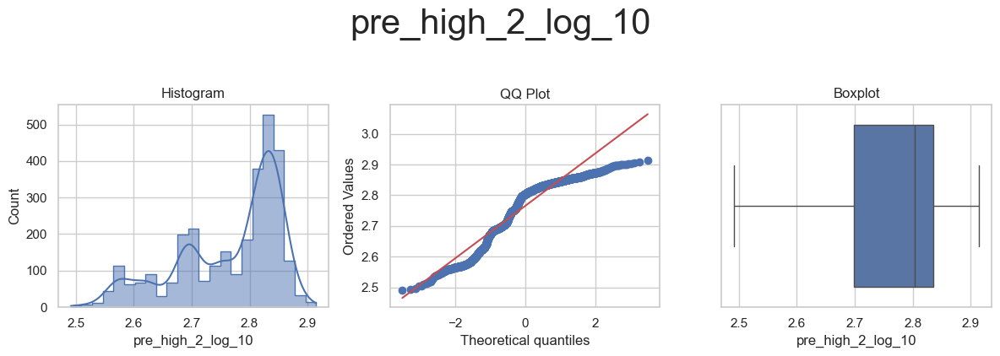

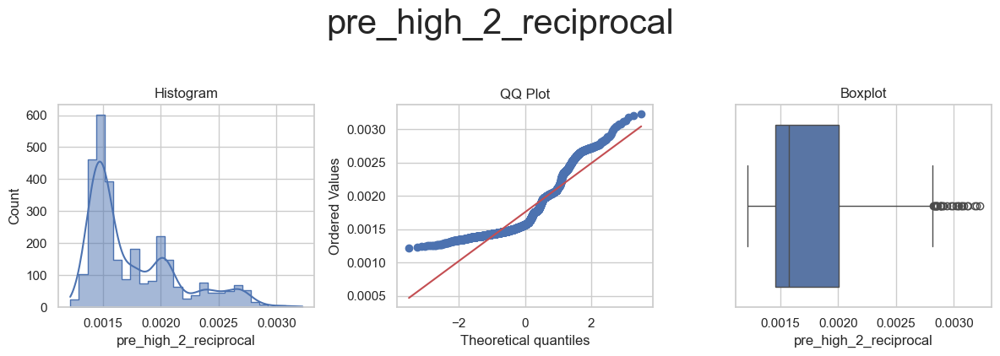

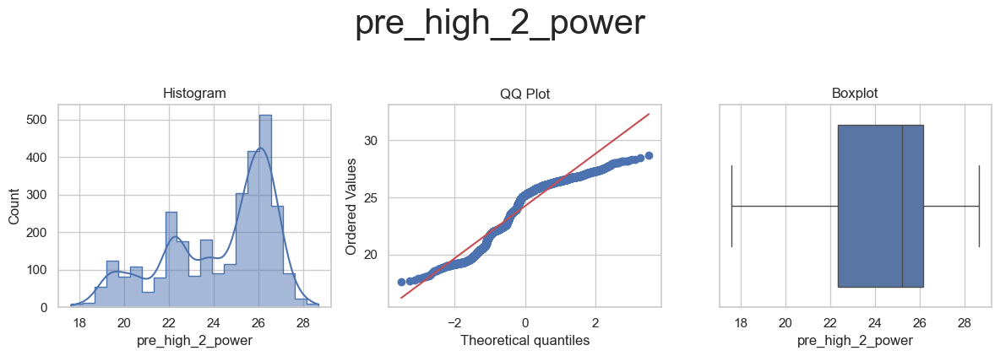

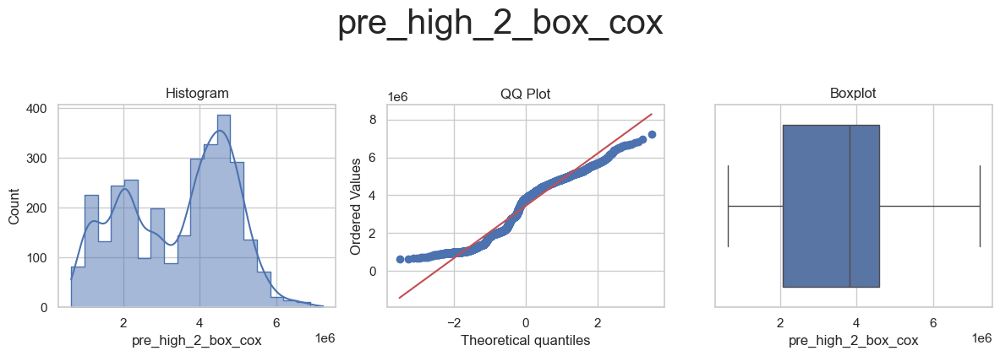

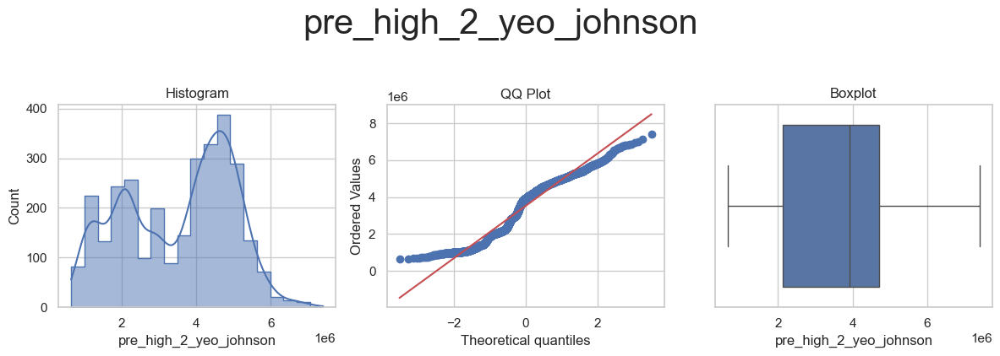



* Variable Analyzed: pre_low
* Applied transformation: ['pre_low_log_e', 'pre_low_log_10', 'pre_low_reciprocal', 'pre_low_power', 'pre_low_box_cox', 'pre_low_yeo_johnson'] 



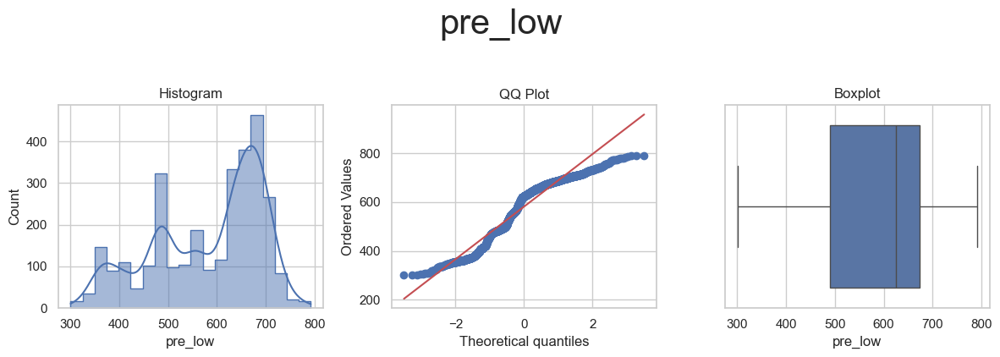

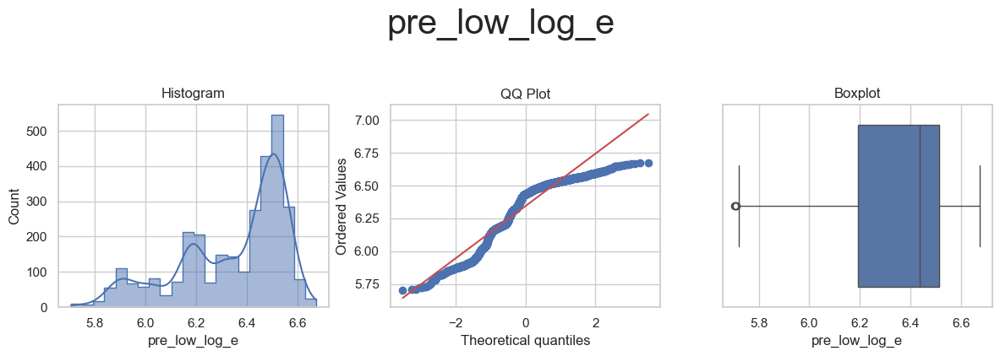

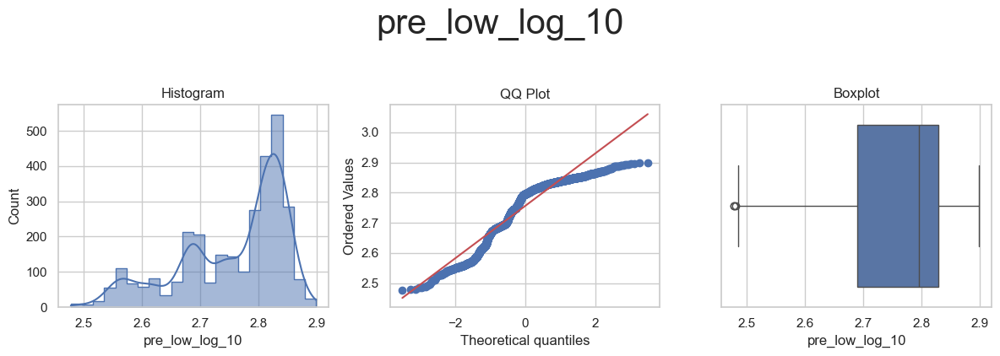

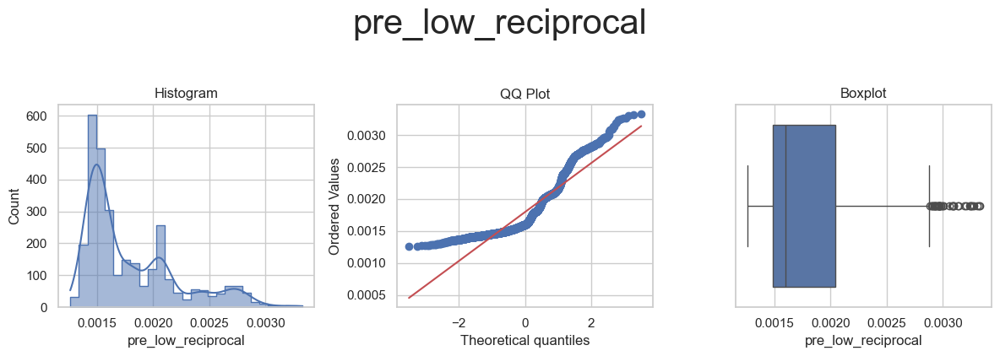

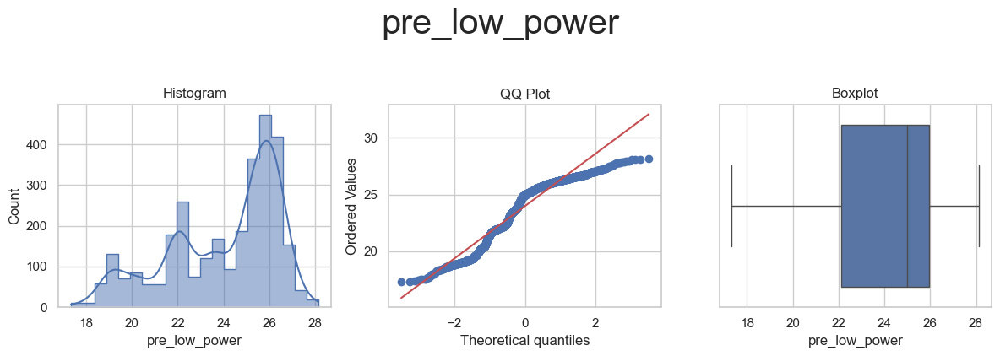

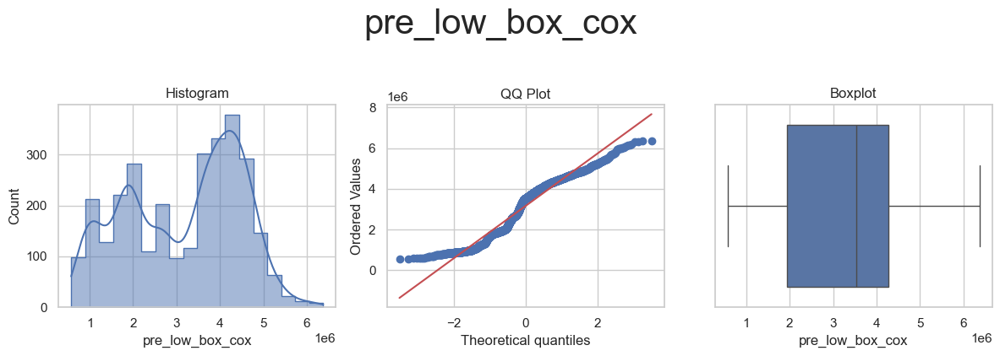

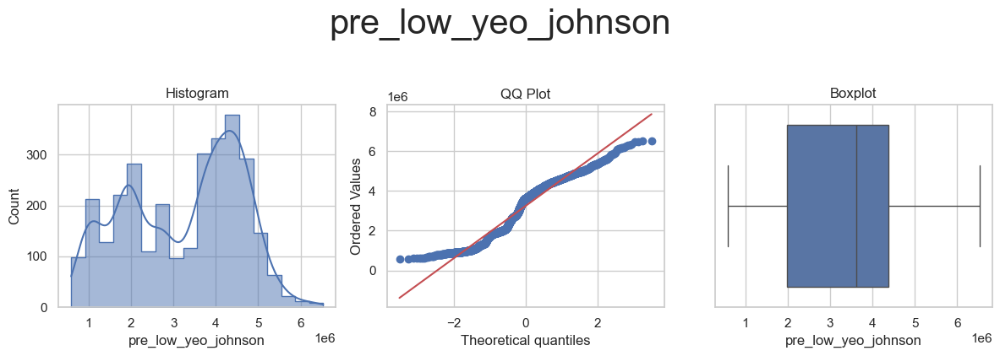



* Variable Analyzed: pre_low_2
* Applied transformation: ['pre_low_2_log_e', 'pre_low_2_log_10', 'pre_low_2_reciprocal', 'pre_low_2_power', 'pre_low_2_box_cox', 'pre_low_2_yeo_johnson'] 



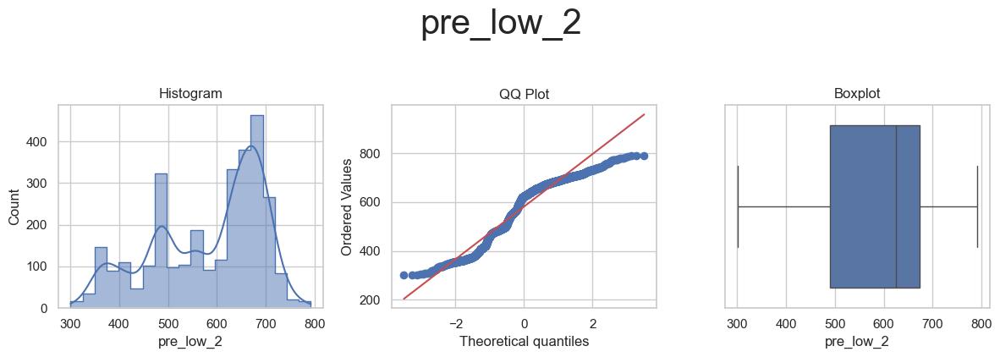

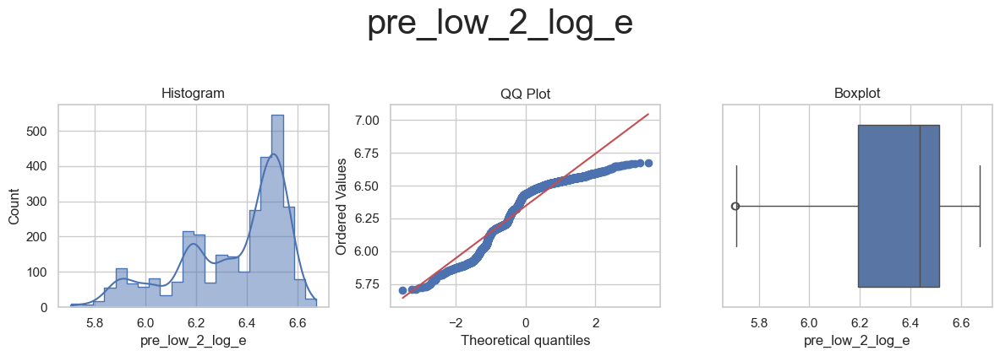

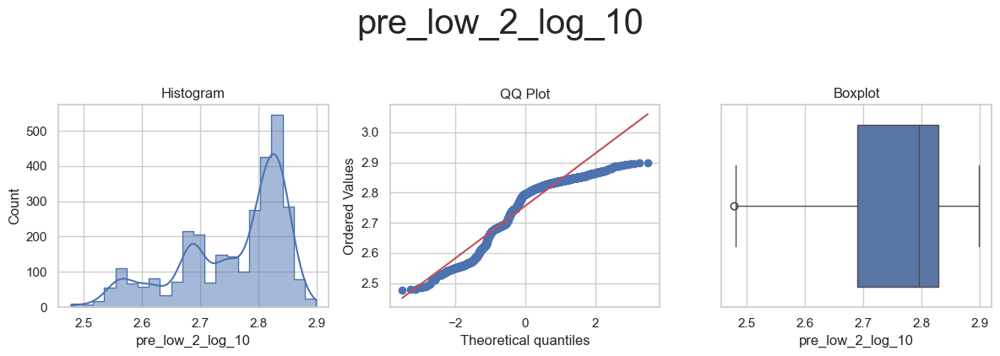

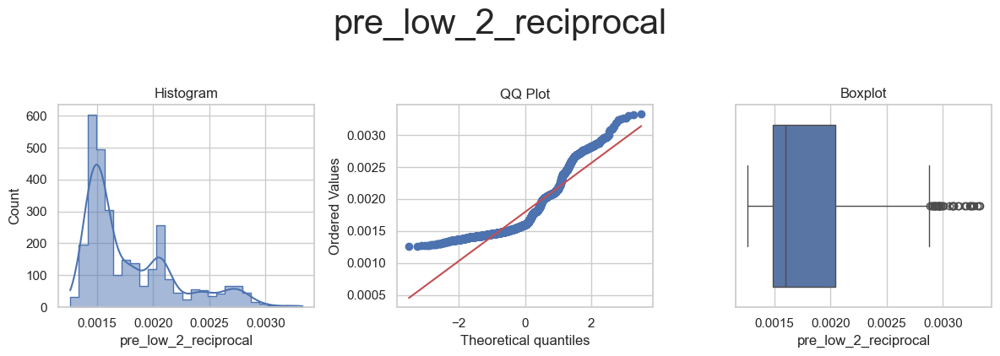

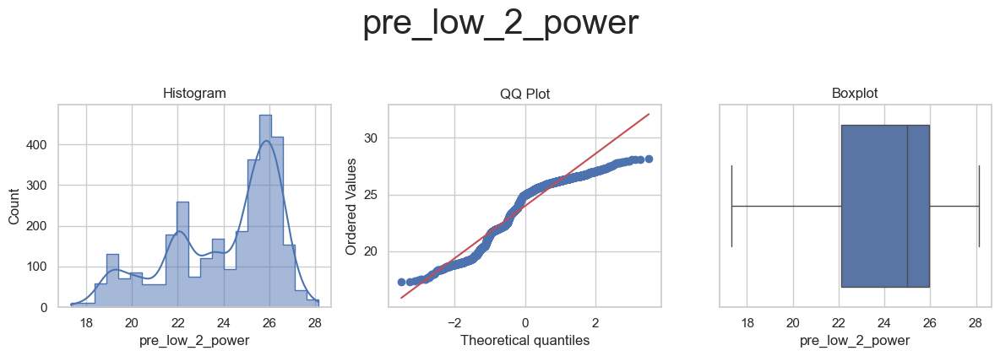

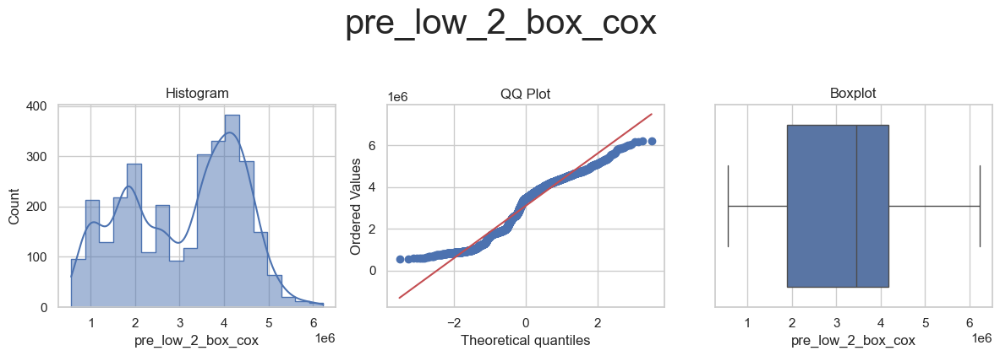

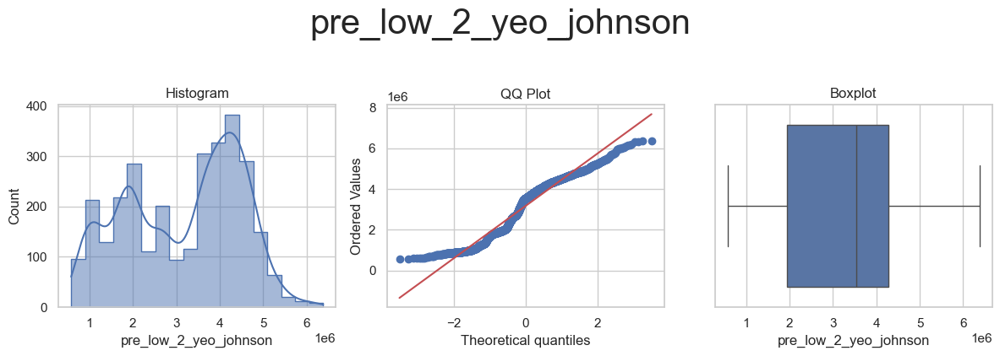



* Variable Analyzed: pre_close
* Applied transformation: ['pre_close_log_e', 'pre_close_log_10', 'pre_close_reciprocal', 'pre_close_power', 'pre_close_box_cox', 'pre_close_yeo_johnson'] 



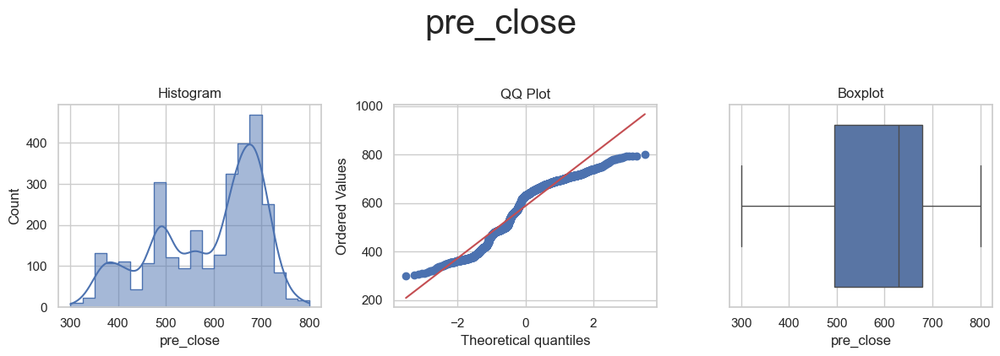

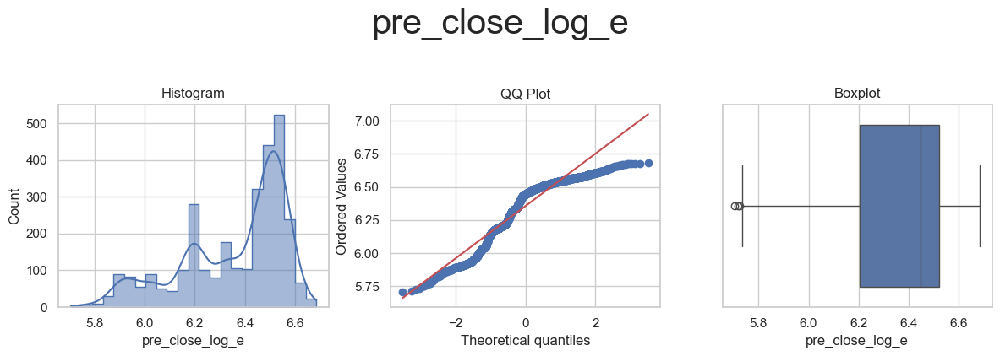

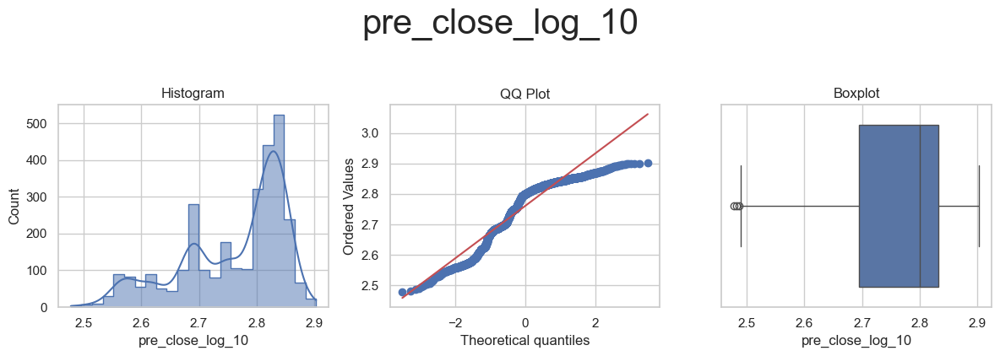

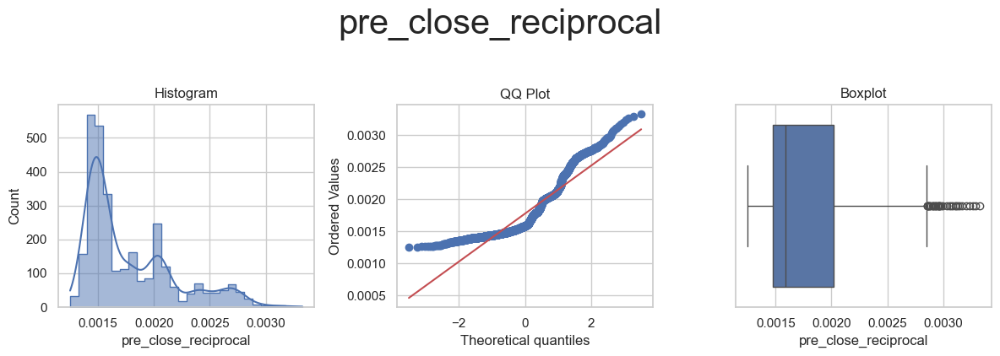

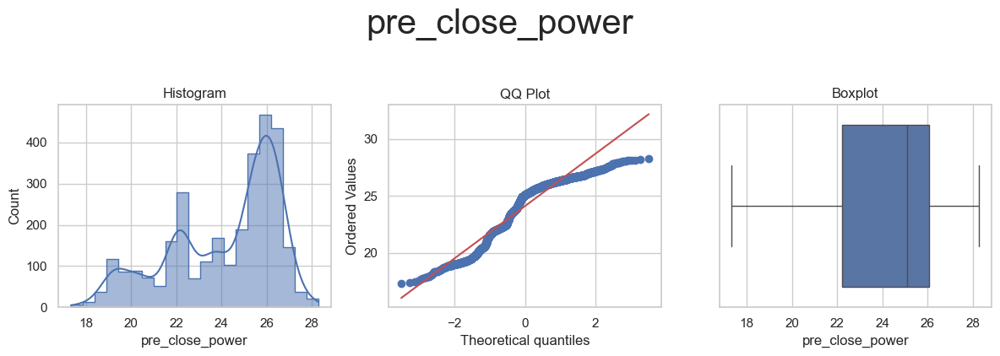

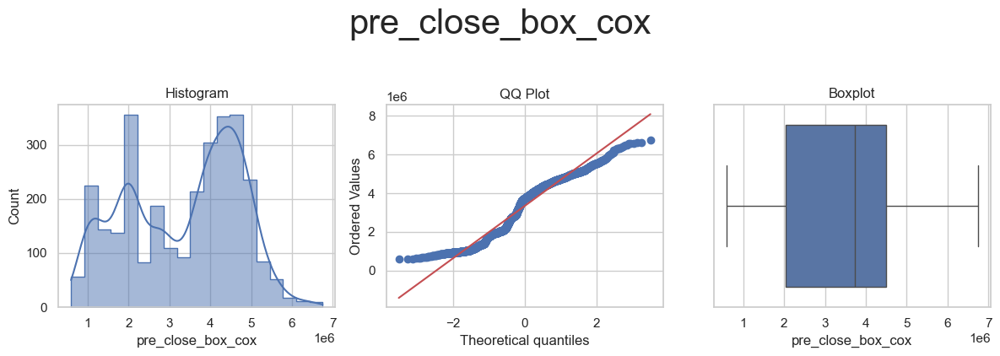

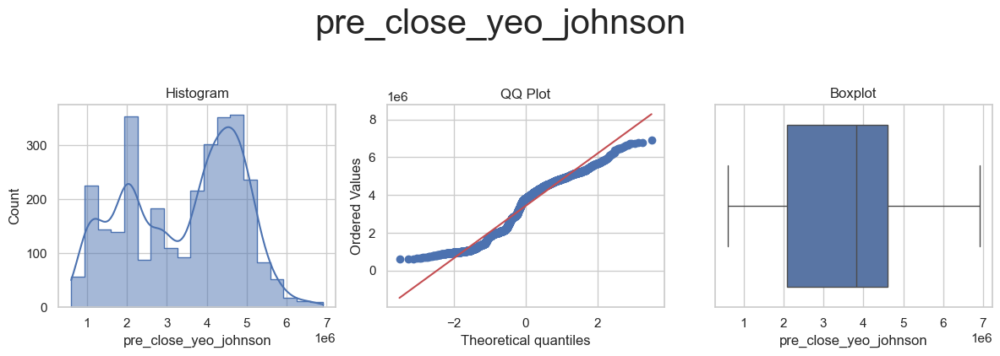



* Variable Analyzed: pre_close_2
* Applied transformation: ['pre_close_2_log_e', 'pre_close_2_log_10', 'pre_close_2_reciprocal', 'pre_close_2_power', 'pre_close_2_box_cox', 'pre_close_2_yeo_johnson'] 



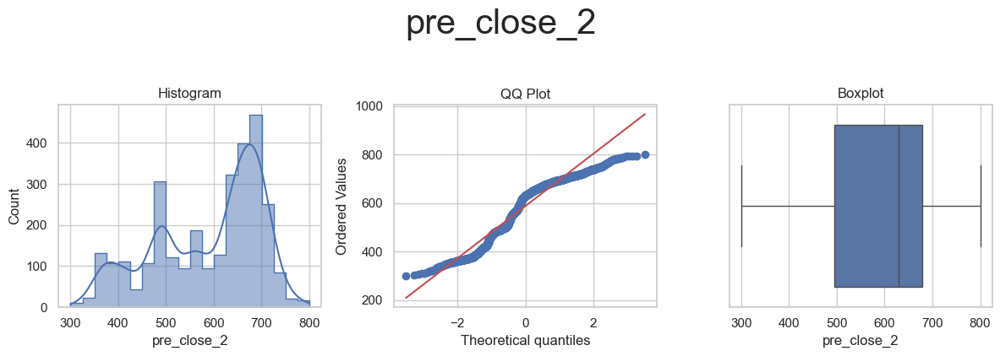

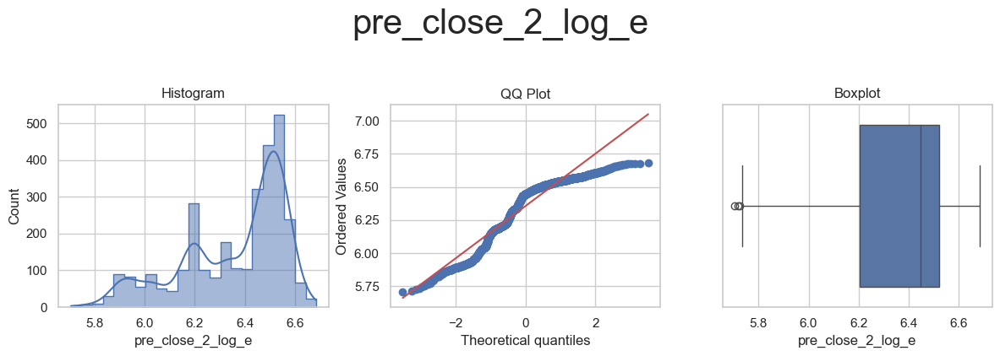

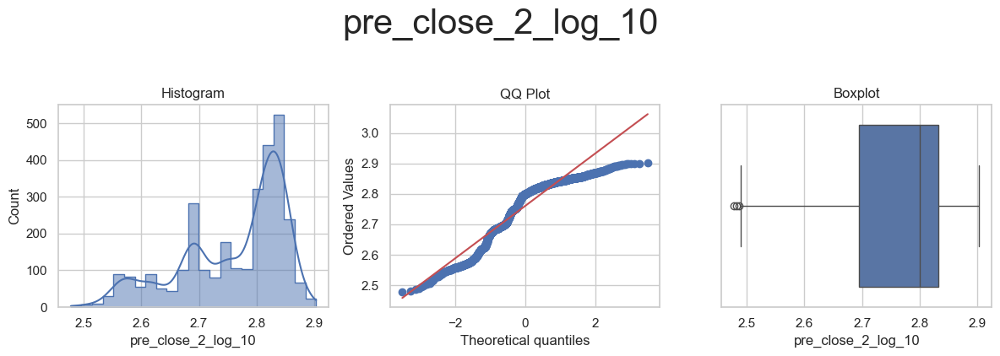

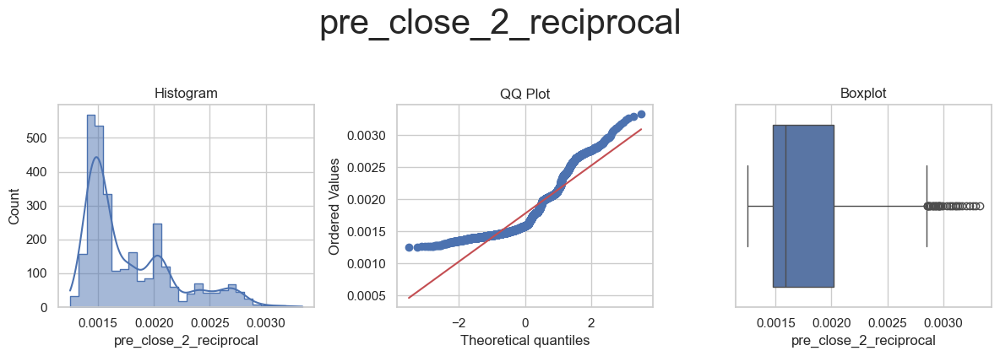

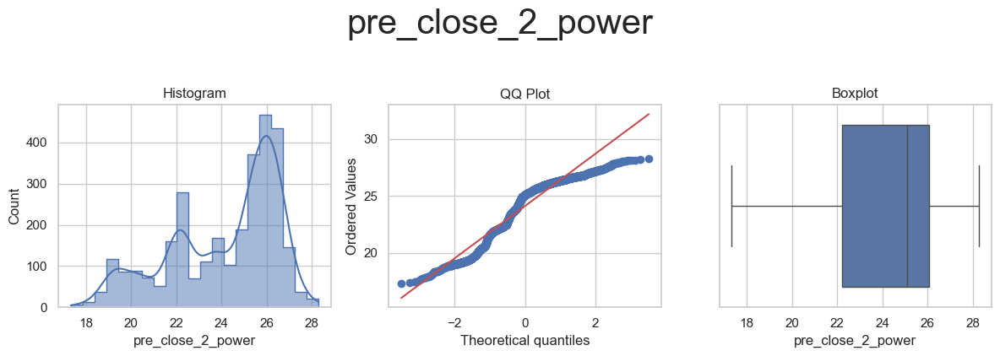

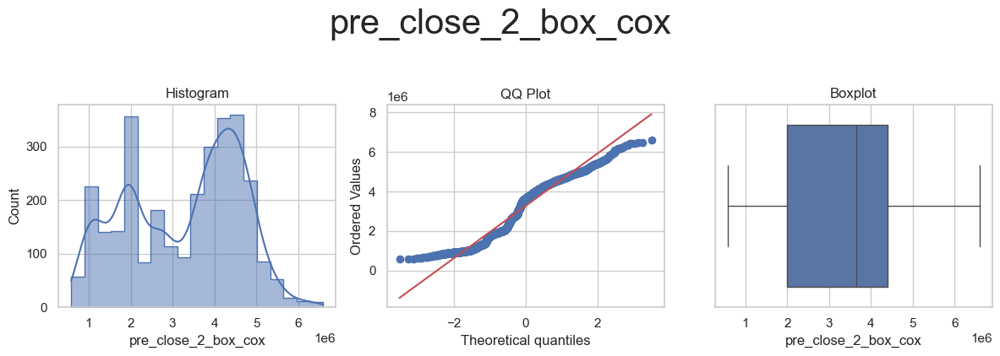

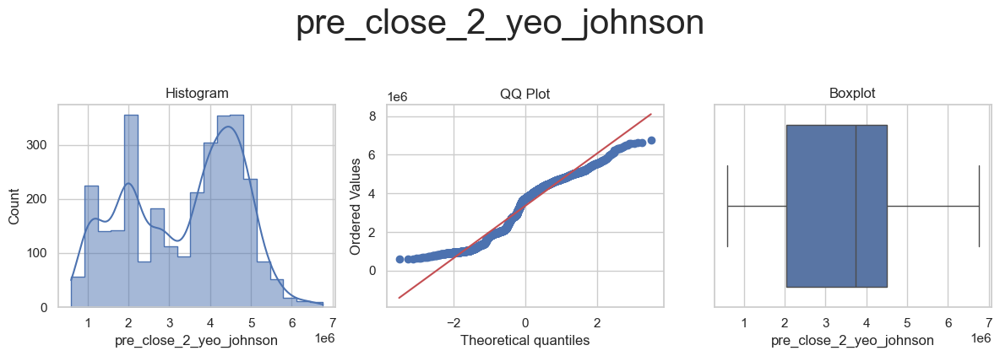



* Variable Analyzed: pre_vol
* Applied transformation: ['pre_vol_log_e', 'pre_vol_log_10', 'pre_vol_reciprocal', 'pre_vol_power', 'pre_vol_box_cox', 'pre_vol_yeo_johnson'] 



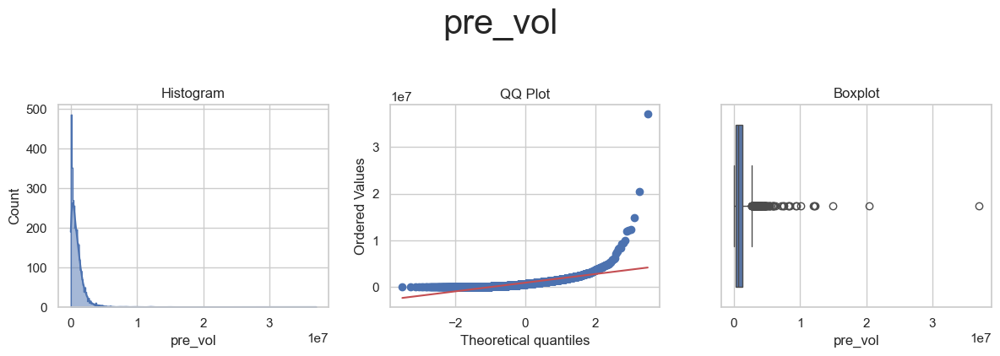

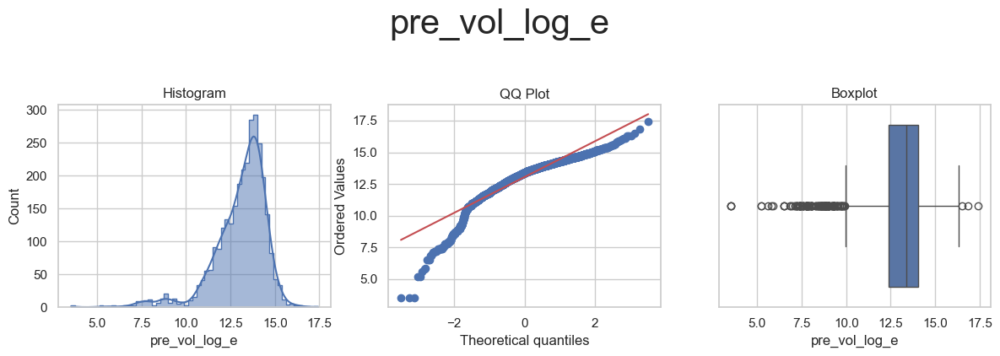

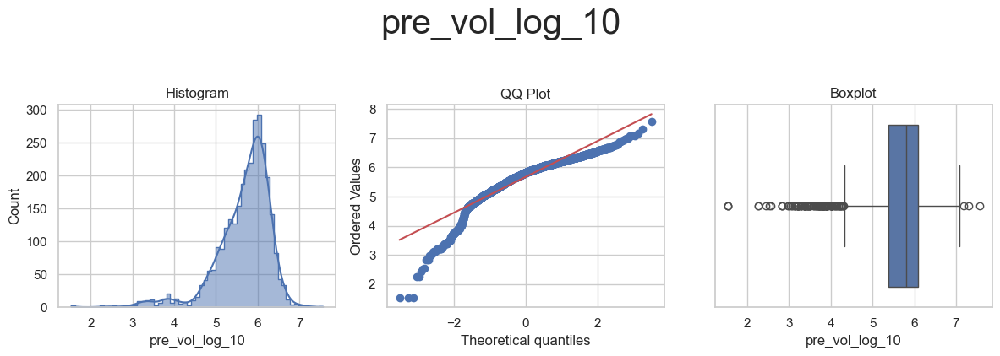

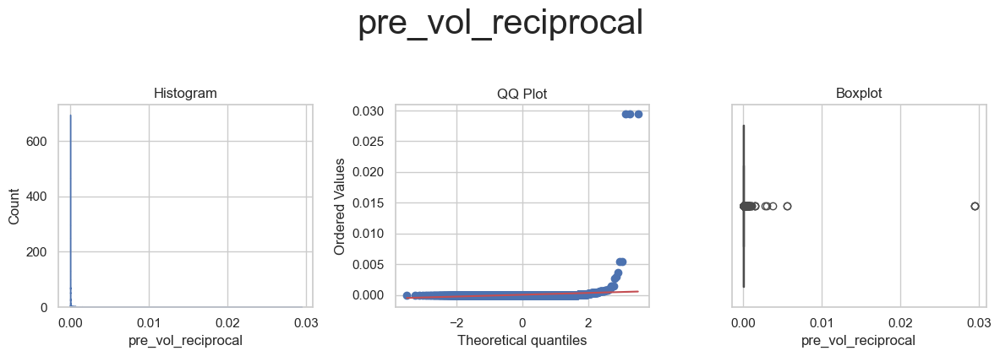

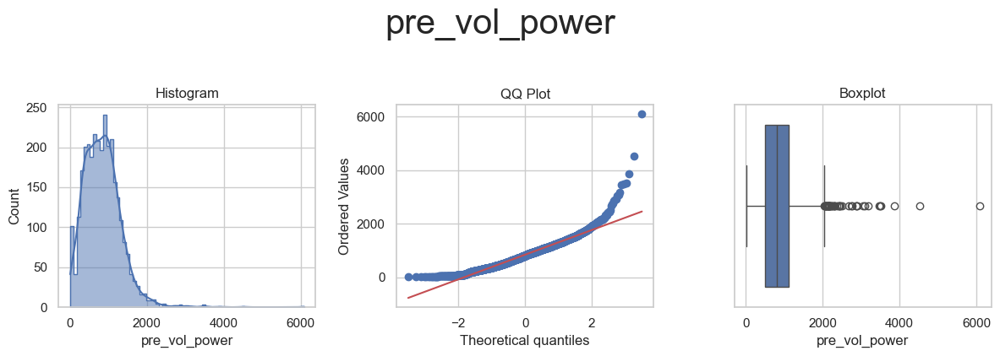

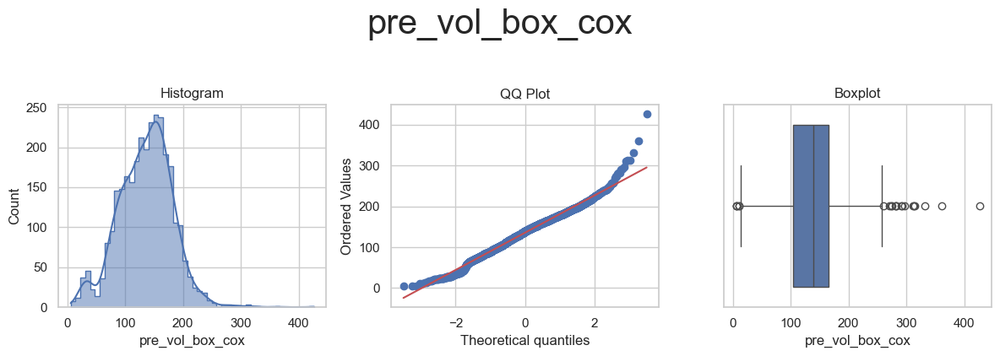

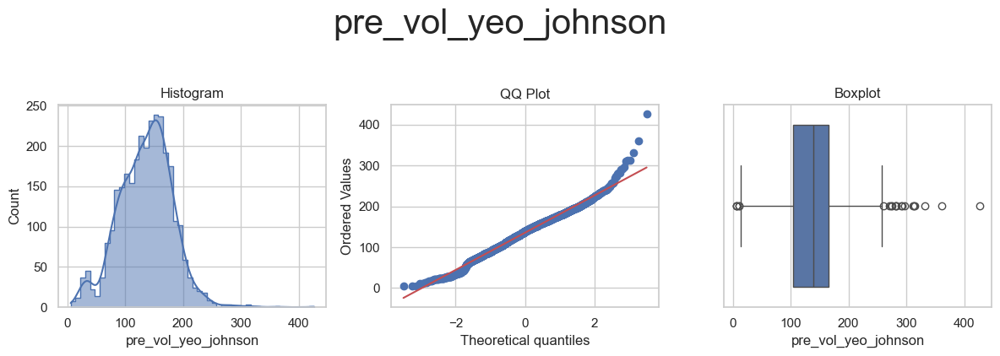



* Variable Analyzed: pre_vol_2
* Applied transformation: ['pre_vol_2_log_e', 'pre_vol_2_log_10', 'pre_vol_2_reciprocal', 'pre_vol_2_power', 'pre_vol_2_box_cox', 'pre_vol_2_yeo_johnson'] 



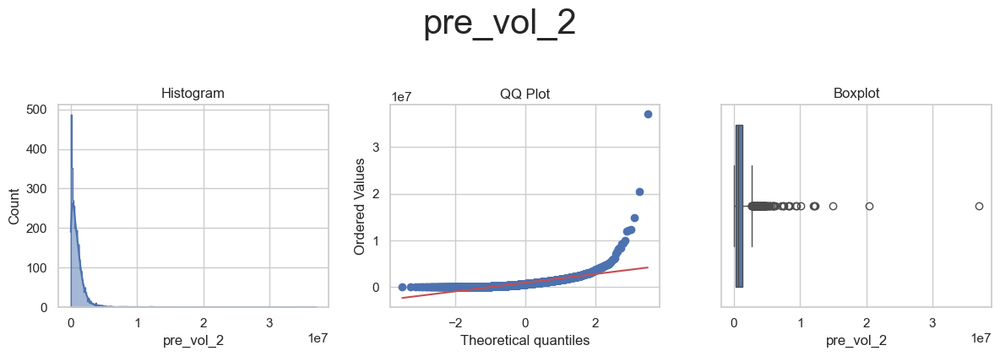

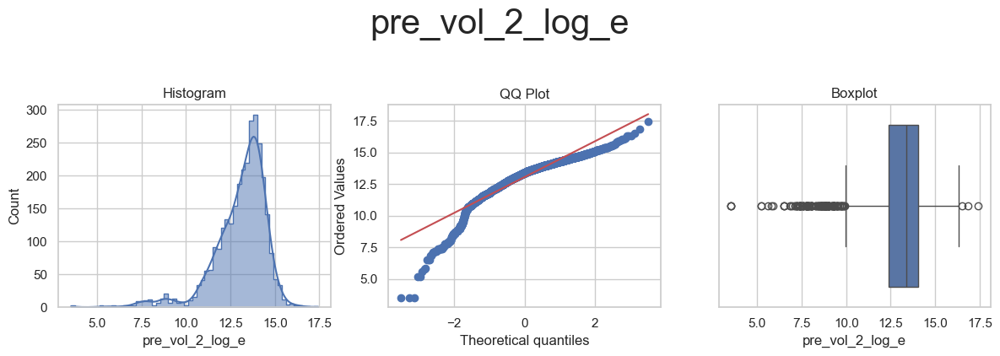

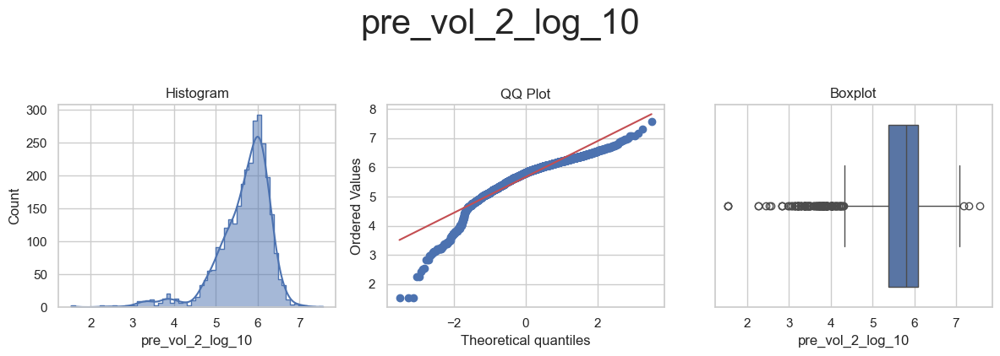

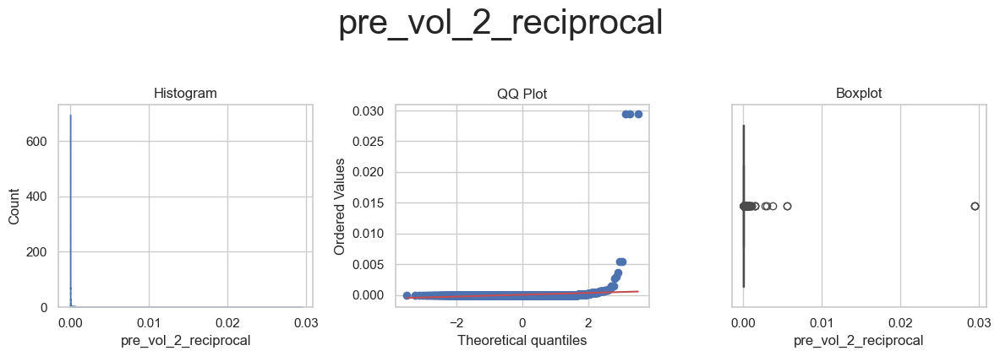

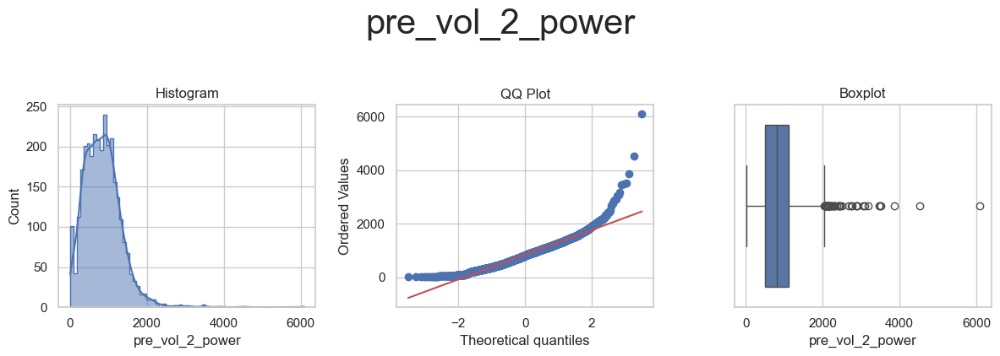

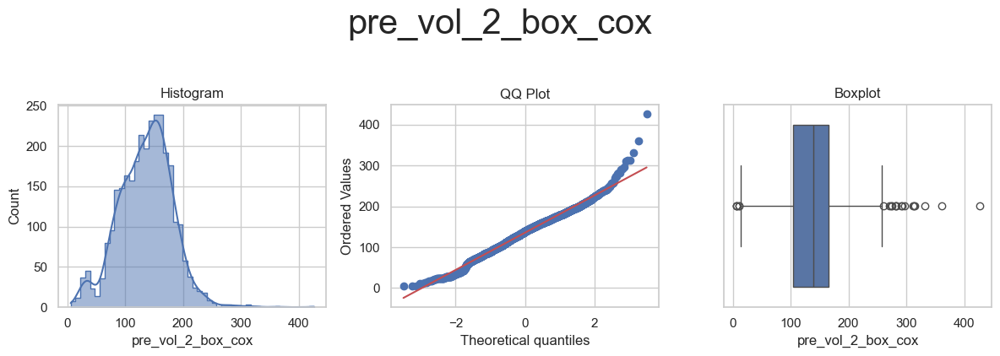

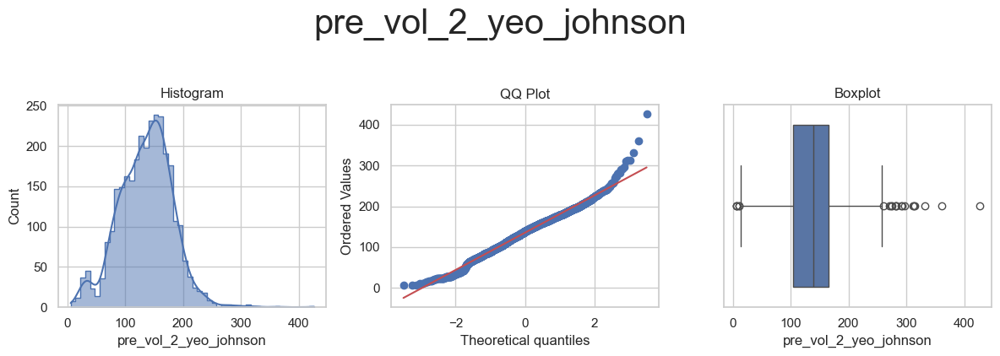



* Variable Analyzed: pre_average
* Applied transformation: ['pre_average_log_e', 'pre_average_log_10', 'pre_average_reciprocal', 'pre_average_power', 'pre_average_box_cox', 'pre_average_yeo_johnson'] 



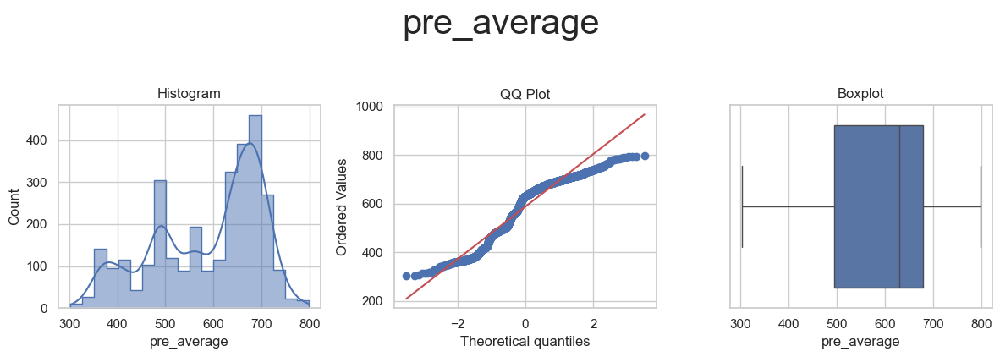

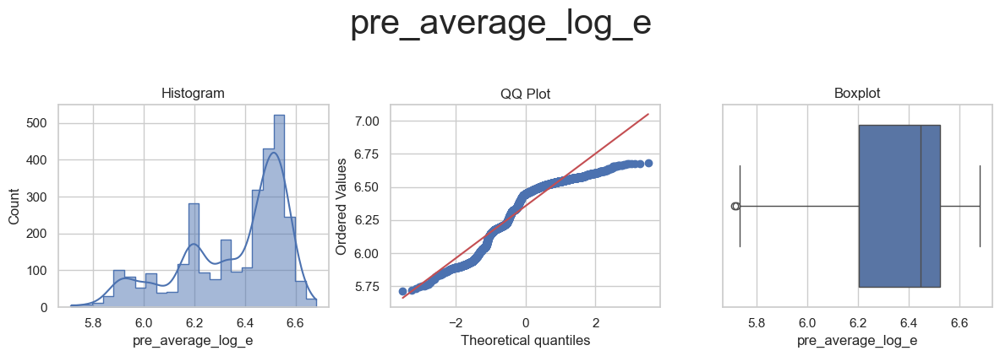

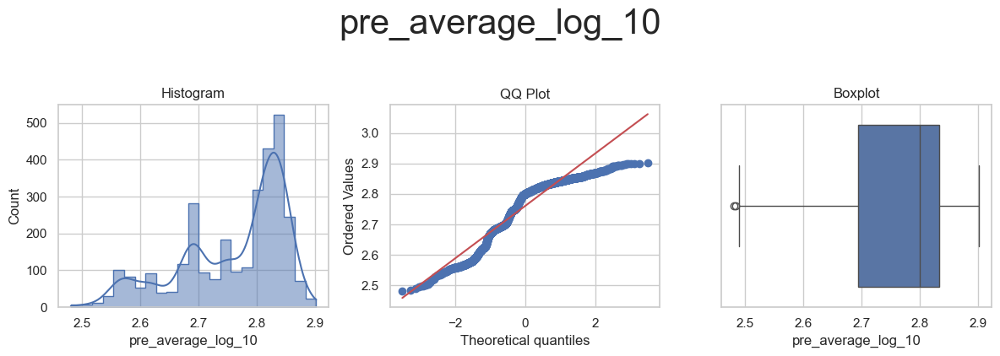

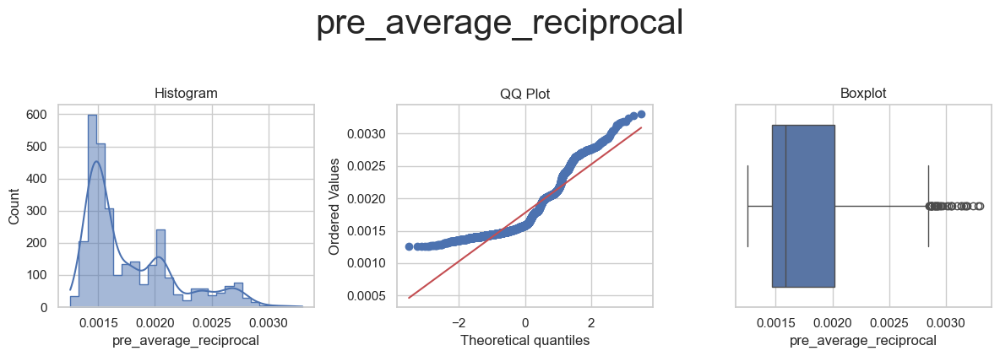

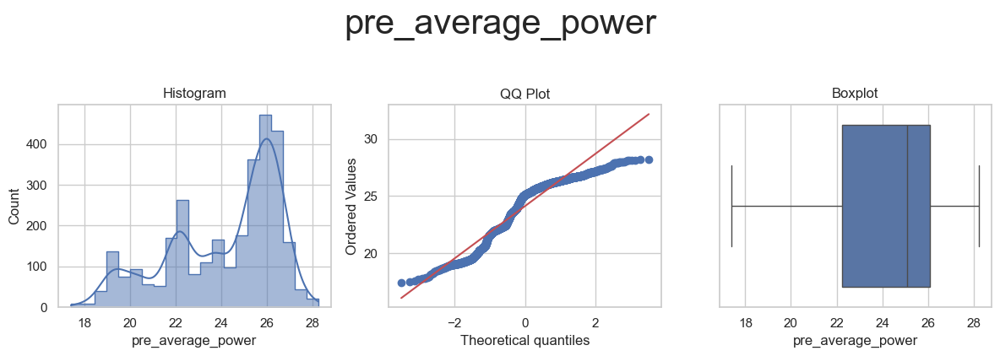

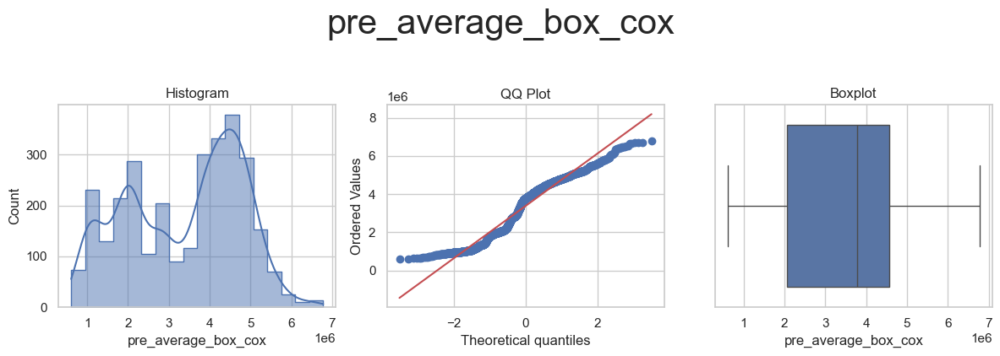

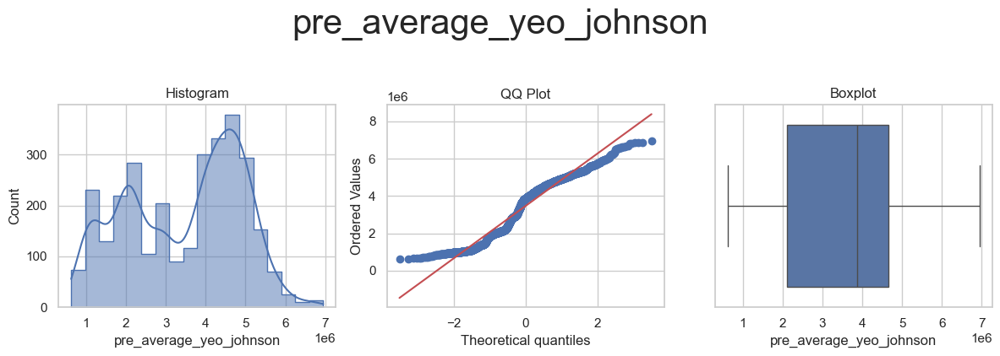



* Variable Analyzed: pre_average_2
* Applied transformation: ['pre_average_2_log_e', 'pre_average_2_log_10', 'pre_average_2_reciprocal', 'pre_average_2_power', 'pre_average_2_box_cox', 'pre_average_2_yeo_johnson'] 



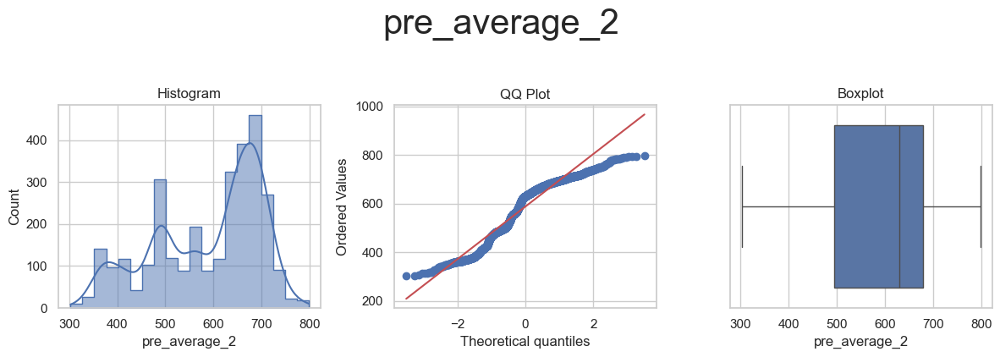

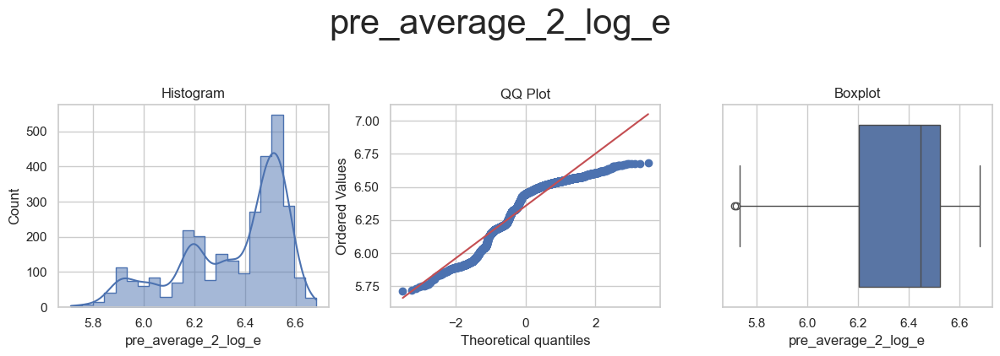

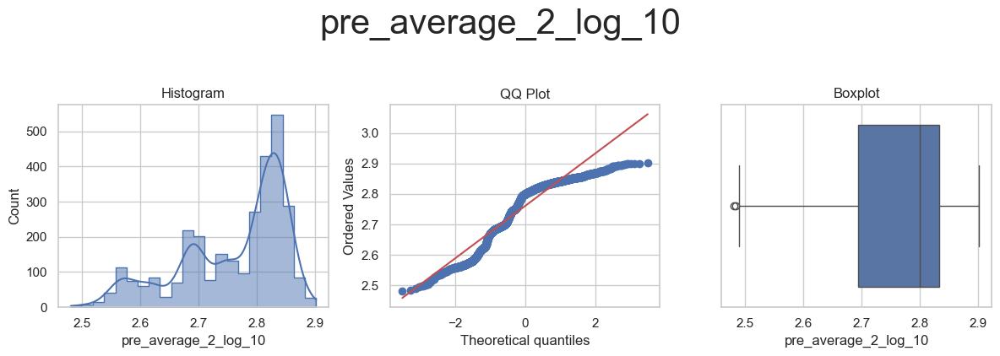

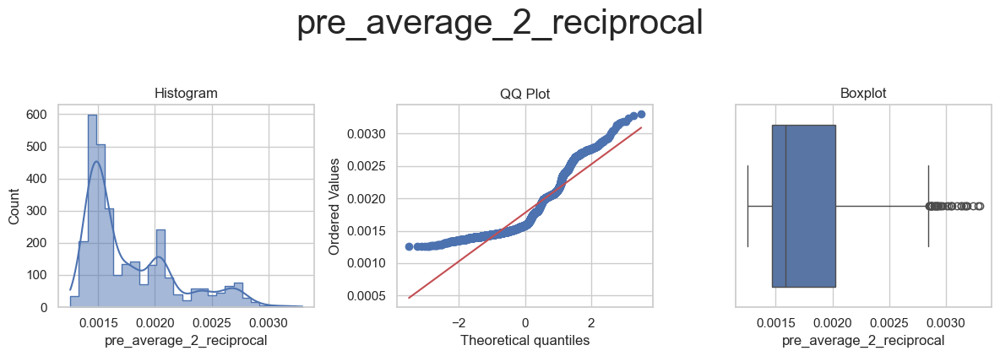

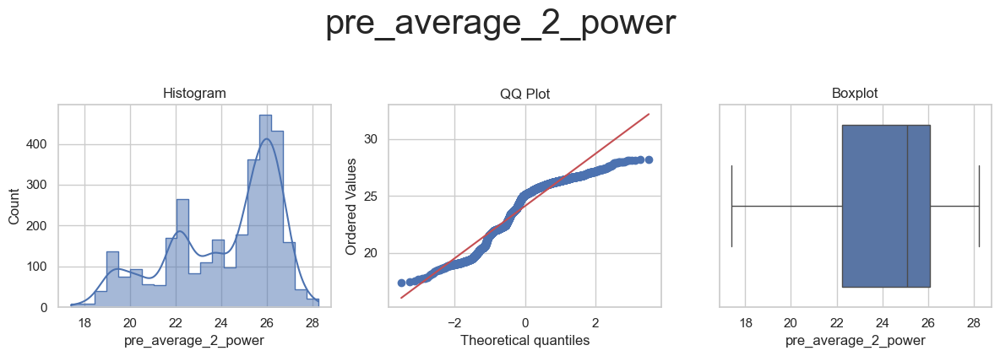

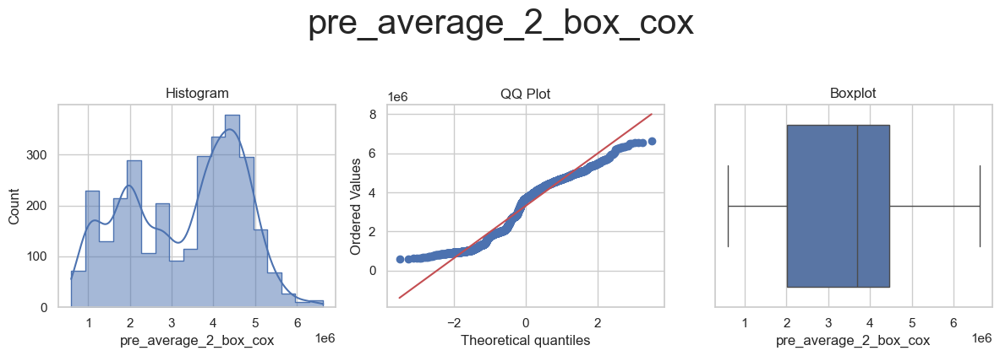

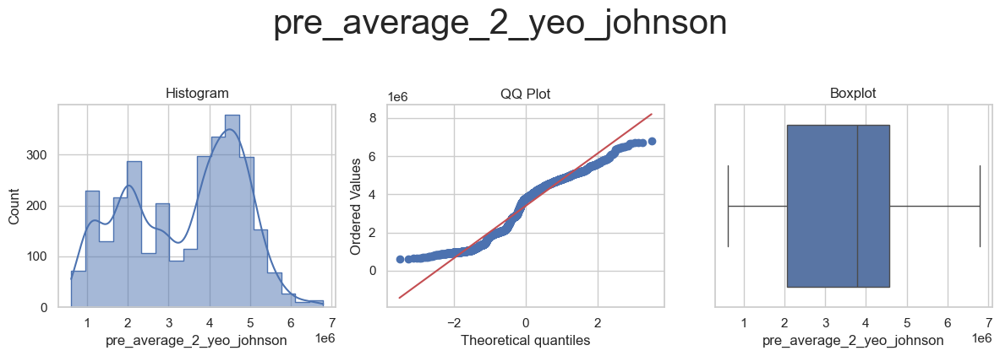



* Variable Analyzed: average
* Applied transformation: ['average_log_e', 'average_log_10', 'average_reciprocal', 'average_power', 'average_box_cox', 'average_yeo_johnson'] 



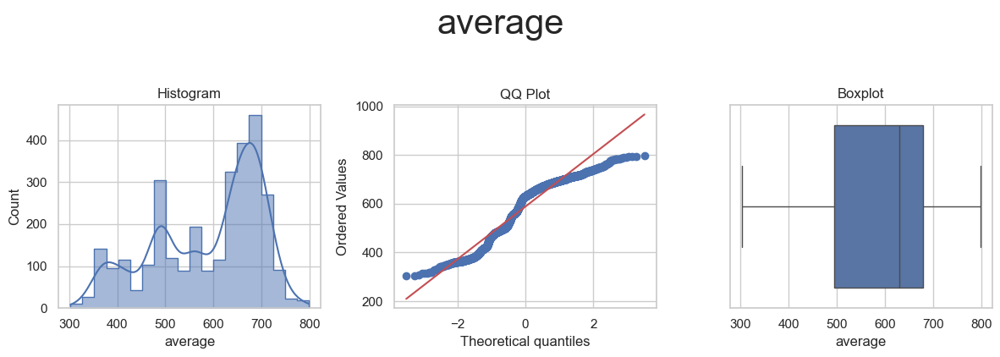

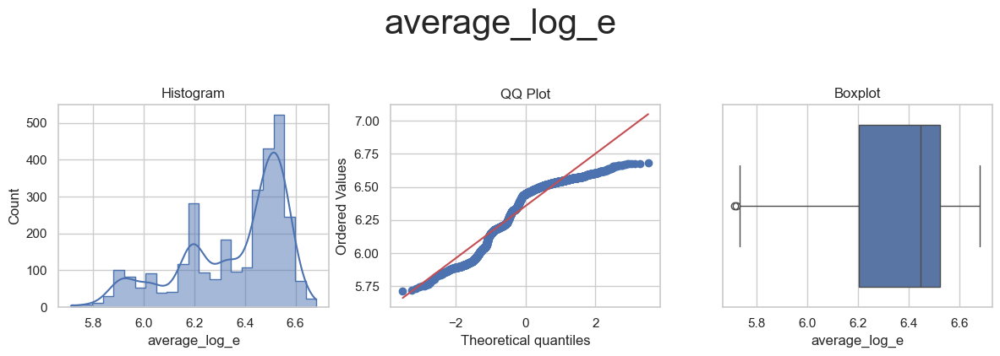

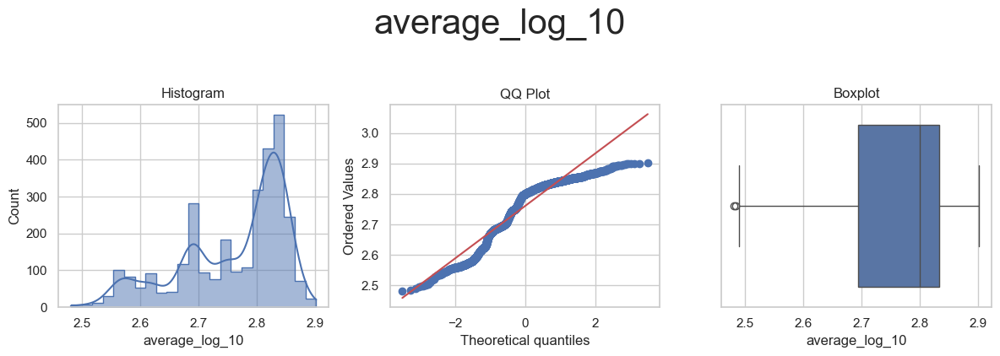

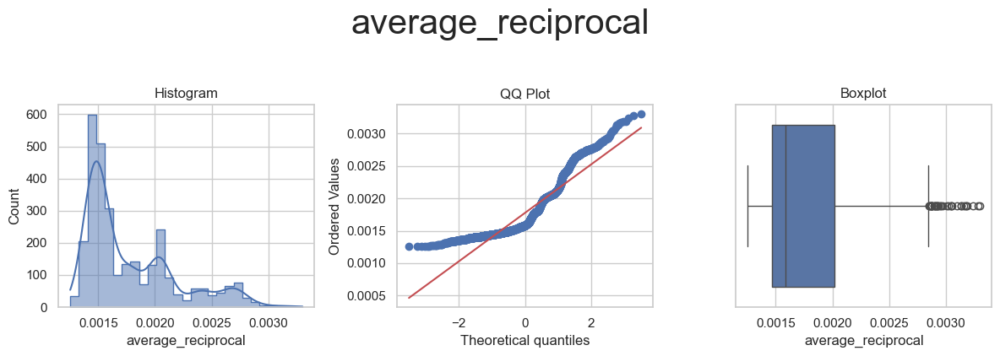

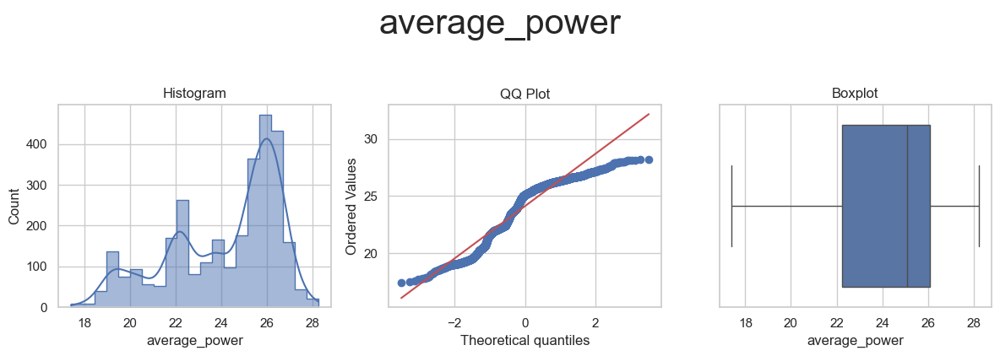

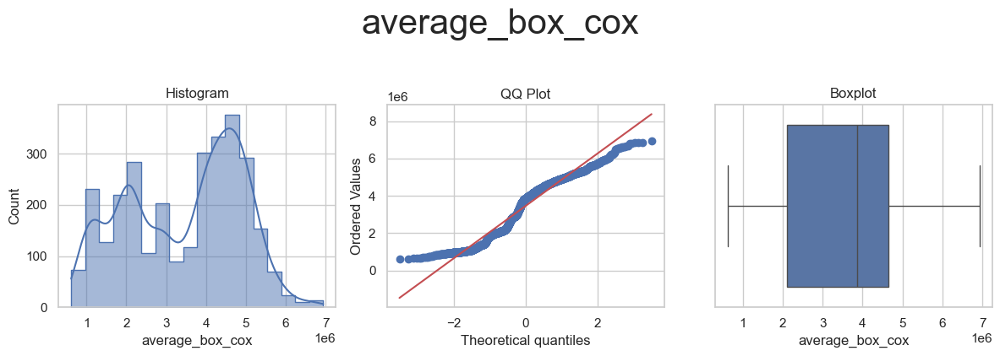

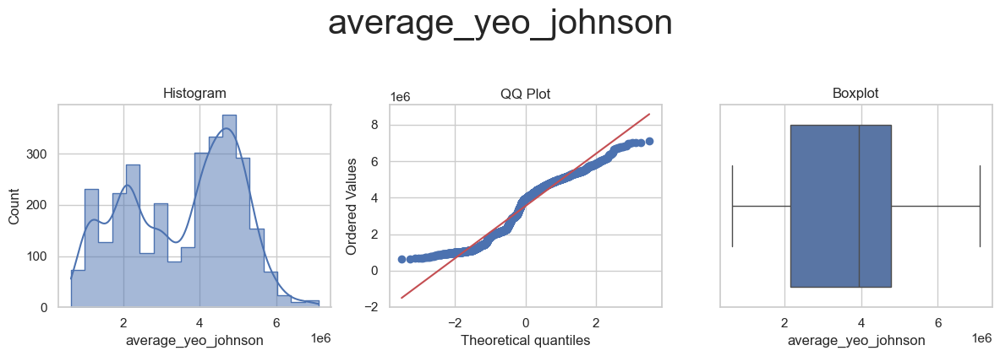

In [11]:
df_engineering_num = FeatureEngineeringAnalysis(df=df_engineering_num, analysis_type='numerical')

## Categorical Analysis

Add categorical features to list

In [12]:
feature_names_cat = TrainSet.columns.tolist()[1:3]
feature_names_cat

['month', 'weekday']

In [13]:
df_engineering_cat = TrainSet[feature_names_cat].copy()
print(df_engineering_cat.shape)
df_engineering_cat.head(3)

(3028, 2)


,month,weekday
0,January,Wednesday
1,January,Thursday
2,January,Friday


Run categorical analysis

* Variable Analyzed: month
* Applied transformation: ['month_ordinal_encoder'] 



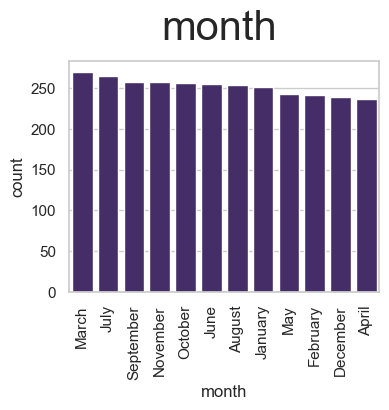

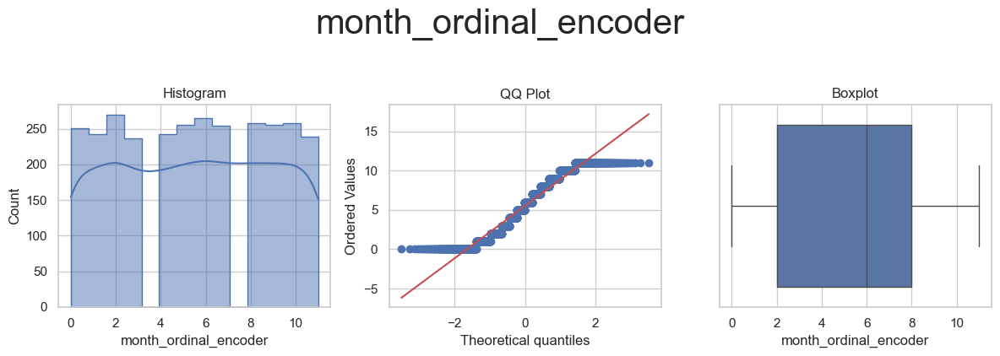



* Variable Analyzed: weekday
* Applied transformation: ['weekday_ordinal_encoder'] 



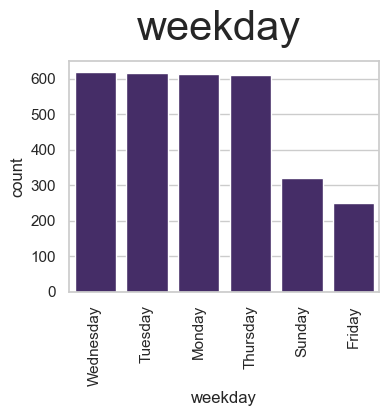

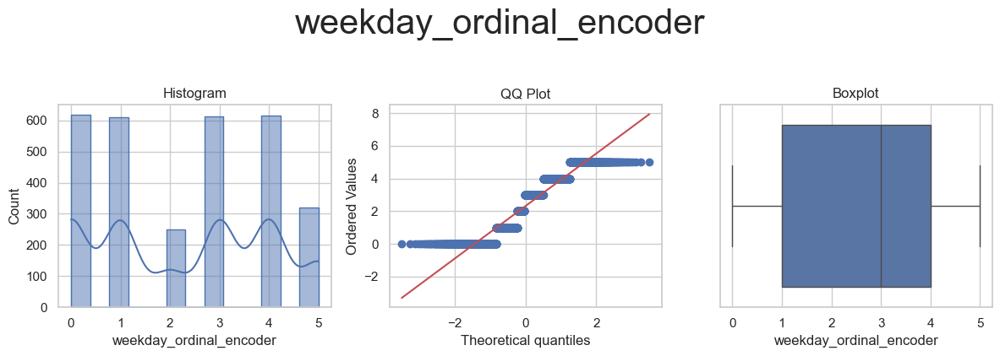

In [14]:
df_engineering_cat = FeatureEngineeringAnalysis(df=df_engineering_cat, analysis_type='ordinal_encoder')

Upon reviewing the Q-Q plots, I observed that the Yeo-Johnson transformation demonstrates a slight improvement toward normality compared to the other transformations. Notably, while handling volume, Yeo-Johnson manages to better align the data with the theoretical quantile line, reducing skewness more effectively. In contrast, most other transformers tend to increase the number of outliers, suggesting less effective normalization across the market indicators

## Fit Numerical Transformer

In [15]:
# the steps are: 
# 1 - create a transformer
# 2 - fit_transform into TrainSet
# 3 - transform into TestSet 
encoder = vt.YeoJohnsonTransformer(variables=feature_names_num)
TrainSet = encoder.fit_transform(TrainSet)
TestSet = encoder.transform(TestSet)

print("* Numerical - YeoJohnsonTransformer transformation done!")

* Numerical - YeoJohnsonTransformer transformation done!


## Fit Categorical Encoder

In [16]:
# the steps are: 
# 1 - create a transformer
# 2 - fit_transform into TrainSet
# 3 - transform into TestSet 
encoder = OrdinalEncoder(encoding_method='arbitrary', variables=feature_names_cat)
TrainSet = encoder.fit_transform(TrainSet)
TestSet = encoder.transform(TestSet)

print("* Categorical encoding - ordinal transformation done!")

* Categorical encoding - ordinal transformation done!


In [17]:
print(TrainSet.shape)
TrainSet

(3028, 23)


,year,month,weekday,open,high,low,close,volume,pre_open,pre_open_2,...,pre_low_2,pre_close,pre_close_2,pre_vol,pre_vol_2,pre_average,pre_average_2,average,tomorrows_average,target
0,31625.437600,0,0,2.020220e+06,2.217622e+06,2.105538e+06,2.169679e+06,42.629730,2.071765e+06,1.751169e+06,...,1.825379e+06,2.124753e+06,2.080571e+06,42.624390,45.513126,2.198790e+06,1.999981e+06,2.193839e+06,505.506095,1
1,31625.437600,0,1,2.116866e+06,2.324413e+06,2.164388e+06,2.230449e+06,36.128814,1.979453e+06,2.028016e+06,...,2.114859e+06,2.124753e+06,2.080571e+06,42.624390,42.612430,2.148740e+06,2.152279e+06,2.277304e+06,503.543762,0
2,31625.437600,0,2,2.076521e+06,2.279829e+06,2.164388e+06,2.230449e+06,36.128814,2.074011e+06,1.937783e+06,...,2.020496e+06,2.184177e+06,2.080571e+06,36.124618,42.612430,2.230371e+06,2.103360e+06,2.255332e+06,503.543762,0
3,31625.437600,0,3,2.076521e+06,2.279829e+06,2.164388e+06,2.230449e+06,36.128814,2.034539e+06,2.030212e+06,...,2.076805e+06,2.184177e+06,2.138674e+06,36.124618,36.115217,2.208882e+06,2.183147e+06,2.255332e+06,499.841217,0
4,31625.437600,0,4,2.038883e+06,2.238242e+06,2.125046e+06,2.189823e+06,36.128814,2.034539e+06,1.991629e+06,...,2.076805e+06,2.184177e+06,2.138674e+06,36.124618,36.115217,2.208882e+06,2.162144e+06,2.214223e+06,500.174462,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3023,31869.134011,11,3,3.594599e+06,4.036287e+06,3.681910e+06,3.798471e+06,234.362024,3.664795e+06,3.656775e+06,...,3.700728e+06,3.961086e+06,3.875216e+06,186.436453,183.480362,3.999963e+06,3.951482e+06,3.879295e+06,630.400061,1
3024,31869.134011,11,4,3.557930e+06,4.080863e+06,3.681910e+06,3.976518e+06,148.820070,3.519196e+06,3.584386e+06,...,3.692096e+06,3.716814e+06,3.875216e+06,234.307852,186.346238,3.796452e+06,3.911904e+06,3.949028e+06,636.284195,1
3025,31869.134011,11,0,3.697322e+06,4.119304e+06,3.817481e+06,4.007711e+06,171.828130,3.483346e+06,3.442187e+06,...,3.527577e+06,3.890777e+06,3.636576e+06,148.790116,234.186527,3.864597e+06,3.713158e+06,4.041586e+06,643.564660,1
3026,31869.134011,11,1,3.743534e+06,4.288391e+06,3.902469e+06,4.188309e+06,149.012948,3.619620e+06,3.407173e+06,...,3.527577e+06,3.921253e+06,3.806530e+06,171.791936,148.723026,3.955045e+06,3.779709e+06,4.157893e+06,650.346296,1


---

# SmartCorrelatedSelection Variables

In [18]:
df_engineering = TrainSet.copy()
df_engineering.head(3)

,year,month,weekday,open,high,low,close,volume,pre_open,pre_open_2,...,pre_low_2,pre_close,pre_close_2,pre_vol,pre_vol_2,pre_average,pre_average_2,average,tomorrows_average,target
0,31625.4376,0,0,2.020220e+06,2.217622e+06,2.105538e+06,2.169679e+06,42.629730,2.071765e+06,1.751169e+06,...,1.825379e+06,2.124753e+06,2.080571e+06,42.624390,45.513126,2.198790e+06,1.999981e+06,2.193839e+06,505.506095,1
1,31625.4376,0,1,2.116866e+06,2.324413e+06,2.164388e+06,2.230449e+06,36.128814,1.979453e+06,2.028016e+06,...,2.114859e+06,2.124753e+06,2.080571e+06,42.624390,42.612430,2.148740e+06,2.152279e+06,2.277304e+06,503.543762,0
2,31625.4376,0,2,2.076521e+06,2.279829e+06,2.164388e+06,2.230449e+06,36.128814,2.074011e+06,1.937783e+06,...,2.020496e+06,2.184177e+06,2.080571e+06,36.124618,42.612430,2.230371e+06,2.103360e+06,2.255332e+06,503.543762,0


In [19]:
from feature_engine.selection import SmartCorrelatedSelection
corr_sel = SmartCorrelatedSelection(variables=None, method="spearman", threshold=0.4, selection_method="variance")

corr_sel.fit_transform(df_engineering)
corr_sel.correlated_feature_sets_

[{'average',
  'close',
  'high',
  'low',
  'open',
  'pre_average',
  'pre_average_2',
  'pre_close',
  'pre_close_2',
  'pre_high',
  'pre_high_2',
  'pre_low',
  'pre_low_2',
  'pre_open',
  'pre_open_2',
  'pre_vol',
  'pre_vol_2',
  'tomorrows_average',
  'volume',
  'year'}]

In [20]:
corr_sel.features_to_drop_

['pre_high',
 'average',
 'close',
 'pre_high_2',
 'pre_average',
 'pre_close',
 'pre_average_2',
 'pre_close_2',
 'low',
 'pre_low',
 'open',
 'pre_low_2',
 'pre_open',
 'pre_open_2',
 'tomorrows_average',
 'year',
 'pre_vol_2',
 'pre_vol',
 'volume']

In [21]:
df_engineering = df_engineering.drop(columns=corr_sel.features_to_drop_)
df_engineering.head()

,month,weekday,high,target
0,0,0,2.217622e+06,1
1,0,1,2.324413e+06,0
2,0,2,2.279829e+06,0
3,0,3,2.279829e+06,0
4,0,4,2.238242e+06,1


---

# Conclusion

The list below shows the transformations needed for feature engineering

* Feature Engineering Transformers

    * Ordinal Categorical Encoding: ['month', 'weekday']

    * Smart Correlation Selection: ['year', 'month', 'weekday']